In [1]:
# ============================================================================
# KAGGLE NOTEBOOK SETUP GUIDE - MODULE 1 - FIXED VERSION

# ============================================================================

"""
CELL 1: Install Compatible Libraries and Import
Run this first in your Kaggle notebook
"""

# First install specific compatible versions
!pip install scikit-image==0.19.3 opencv-python numpy==1.23.5 -q

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from skimage import io, color, exposure, filters, restoration
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from skimage.util import random_noise
import os
import warnings
warnings.filterwarnings('ignore')

plt.style.use('default')
print("✓ Libraries imported successfully!")
print(f"NumPy version: {np.__version__}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 73.9 MB/s eta 0:00:0000:0100:01
^C
ERROR: Operation cancelled by user
✓ Libraries imported successfully!
NumPy version: 1.26.4


In [10]:
import os
import cv2
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output

# Root dataset path
DATASET_PATH = '/kaggle/input/dataset-tomato-split/train'

# List all subfolders (classes)
subfolders = [f for f in os.listdir(DATASET_PATH) 
              if os.path.isdir(os.path.join(DATASET_PATH, f))]
print("Found subfolders (classes):", subfolders)

# Folder dropdown
folder_dropdown = widgets.Dropdown(
    options=subfolders,
    description='Select class:',
    layout=widgets.Layout(width='90%')
)
display(folder_dropdown)

# Image dropdown (empty first)
image_dropdown = widgets.Dropdown(
    options=[],
    description='Select image:',
    layout=widgets.Layout(width='90%')
)
display(image_dropdown)

# Output area
out = widgets.Output()
display(out)

# Update images when folder changes
def update_images(change):
    folder_path = os.path.join(DATASET_PATH, folder_dropdown.value)
    images = [f for f in os.listdir(folder_path)
              if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    
    image_dropdown.options = images
    if images:
        image_dropdown.value = images[0]  # auto-select first image

folder_dropdown.observe(update_images, names='value')

# Display selected image
def display_image(change):
    with out:
        clear_output(wait=True)
        img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)
        
        img = cv2.imread(img_path)
        if img is None:
            print("Failed to load image!")
            return
        
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(6,6))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Image: {image_dropdown.value}")
        plt.show()

        print(f"Image shape: {img.shape}")
        print(f"Loaded from: {img_path}")

image_dropdown.observe(display_image, names='value')

# Initialize first folder at start
update_images(None)


Found subfolders (classes): ['Leaf_Mold227', 'healthy227', 'Tomato_Yellow_Leaf_Curl_Virus227', 'Target_Spot227', 'Septoria_leaf_spot227', 'Early_blight227', 'Two-spotted_spider_mite227', 'Late_blight227', 'Bacterial_spot227']


Dropdown(description='Select class:', layout=Layout(width='90%'), options=('Leaf_Mold227', 'healthy227', 'Toma…

Dropdown(description='Select image:', layout=Layout(width='90%'), options=(), value=None)

Output()

In [11]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import cv2
import matplotlib.pyplot as plt
import os

# ---------- Helper: Show multiple images ----------
def show_images(images, titles, rows=1, figsize=(15,5)):
    cols = len(images)
    plt.figure(figsize=figsize)
    for i, img in enumerate(images):
        plt.subplot(rows, cols, i+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(titles[i])
    plt.show()

# ---------- DATASET ROOT ----------
DATASET_PATH = '/kaggle/input/dataset-tomato-split/train'

# List subfolders
subfolders = [f for f in os.listdir(DATASET_PATH) if os.path.isdir(os.path.join(DATASET_PATH, f))]
print("Found subfolders (classes):", subfolders)

# ---------- Dropdown widgets ----------
folder_dropdown = widgets.Dropdown(
    options=subfolders,
    description='Select folder:',
    layout=widgets.Layout(width='90%')
)
image_dropdown = widgets.Dropdown(
    options=[],
    description='Select image:',
    layout=widgets.Layout(width='90%')
)

out = widgets.Output()

display(folder_dropdown)
display(image_dropdown)
display(out)

# ---------- Update images when folder changes ----------
def update_images(change):
    folder_path = os.path.join(DATASET_PATH, folder_dropdown.value)
    images = [f for f in os.listdir(folder_path)
              if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    image_dropdown.options = images
    if images:
        image_dropdown.value = images[0]

folder_dropdown.observe(update_images, names='value')

# ---------- Display image + apply geometric transforms ----------
def display_and_transform(change):
    with out:
        clear_output(wait=True)

        img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

        # Check existence
        if not os.path.isfile(img_path):
            print("File not found:", img_path)
            return

        # Load image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Show original
        plt.figure(figsize=(6,6))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Original Image: {image_dropdown.value}")
        plt.show()

        print(f"Image shape: {img.shape}")
        print(f"Loaded from: {img_path}")

        # ----------------------
        #   GEOMETRIC TRANSFORMS
        # ----------------------
        h, w = img.shape[:2]
        center = (w // 2, h // 2)

        # Rotation
        angles = [0, 45, 90, 135, 180]
        rotated_imgs = []
        for angle in angles:
            M = cv2.getRotationMatrix2D(center, angle, 1.0)
            rotated_imgs.append(cv2.warpAffine(img, M, (w, h)))

        show_images(rotated_imgs, [f"{a}°" for a in angles], rows=1)

        # Scaling
        scales = [0.75, 1.0, 1.5]
        scaled_imgs = []
        for scale in scales:
            new_w, new_h = int(w * scale), int(h * scale)
            temp = cv2.resize(img, (new_w, new_h))

            # crop back to original size
            if scale > 1.0:
                start_x, start_y = (new_w - w) // 2, (new_h - h) // 2
                temp = temp[start_y:start_y+h, start_x:start_x+w]
            elif scale < 1.0:
                pad_h, pad_w = (h - new_h) // 2, (w - new_w) // 2
                temp = cv2.copyMakeBorder(
                    temp, pad_h, h-new_h-pad_h,
                    pad_w, w-new_w-pad_w,
                    cv2.BORDER_CONSTANT, value=[0,0,0]
                )
            scaled_imgs.append(temp)

        show_images(scaled_imgs, [f"Scale {s}x" for s in scales], rows=1)

        print("✓ Geometric transformations completed!")

# trigger when image is selected
image_dropdown.observe(display_and_transform, names='value')

# initialize
update_images(None)


Found subfolders (classes): ['Leaf_Mold227', 'healthy227', 'Tomato_Yellow_Leaf_Curl_Virus227', 'Target_Spot227', 'Septoria_leaf_spot227', 'Early_blight227', 'Two-spotted_spider_mite227', 'Late_blight227', 'Bacterial_spot227']


Dropdown(description='Select folder:', layout=Layout(width='90%'), options=('Leaf_Mold227', 'healthy227', 'Tom…

Dropdown(description='Select image:', layout=Layout(width='90%'), options=(), value=None)

Output()

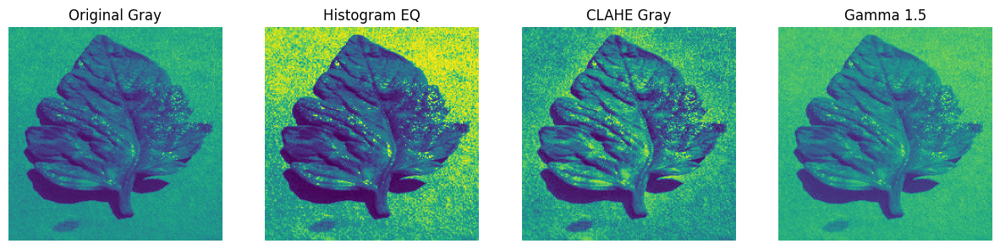

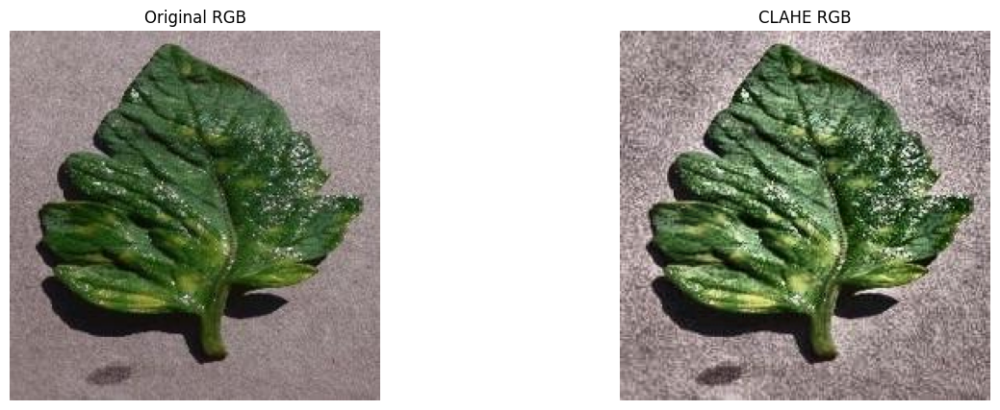

✓ Intensity transformations completed!
  ✔ CLAHE gives the best balanced contrast enhancement


In [13]:
"""
CELL 5: Intensity Transformations (UPDATED to use selected image)
"""

# Load image selected by the user
img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

if not os.path.isfile(img_path):
    print(f"❌ File not found: {img_path}")
else:
    # Read + convert to RGB
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Histogram Equalization
    hist_eq = cv2.equalizeHist(gray)

    # CLAHE (better than regular histogram eq)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    clahe_result = clahe.apply(gray)

    # Gamma Correction
    gamma = 1.5
    inv_gamma = 1.0 / gamma
    table = np.array([((i/255.0)**inv_gamma)*255 for i in range(256)]).astype("uint8")
    gamma_corrected = cv2.LUT(gray, table)

    # Display grayscale-based intensity transformations
    results = [gray, hist_eq, clahe_result, gamma_corrected]
    titles = ['Original Gray', 'Histogram EQ', 'CLAHE Gray', f'Gamma {gamma}']

    show_images(results, titles, rows=1)

    # Apply CLAHE to RGB image (L-channel only)
    img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    img_lab[:, :, 0] = clahe.apply(img_lab[:, :, 0])
    img_clahe_rgb = cv2.cvtColor(img_lab, cv2.COLOR_LAB2RGB)

    # Display original vs CLAHE-enhanced RGB
    show_images([img, img_clahe_rgb], ['Original RGB', 'CLAHE RGB'], rows=1)

    print("✓ Intensity transformations completed!")
    print("  ✔ CLAHE gives the best balanced contrast enhancement")


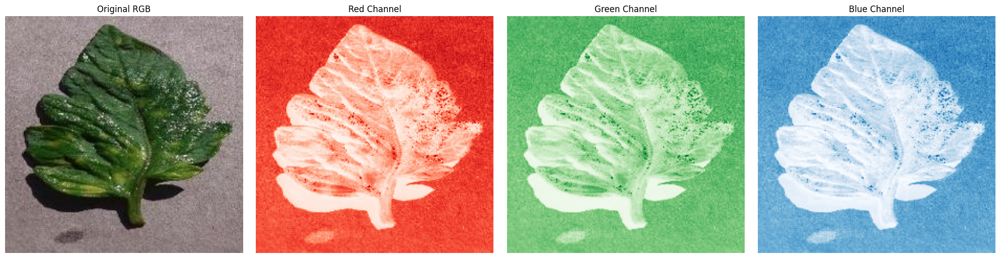

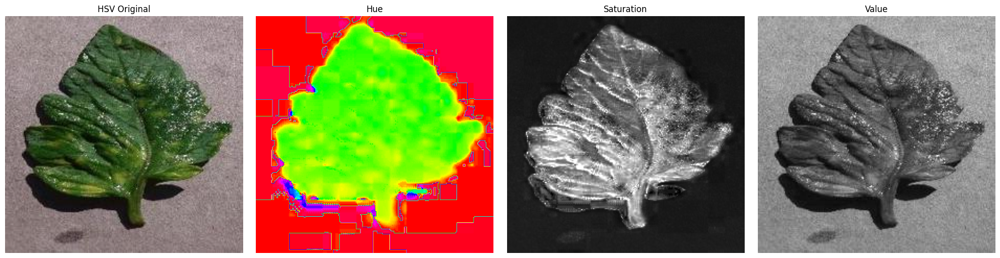

✓ Color space analysis completed!
  Key insight: HSV HUE channel often reveals disease patterns best.


In [14]:
"""
CELL 6: Color Space Analysis
"""

# Ensure the selected image is loaded
img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

if not os.path.isfile(img_path):
    print(f"❌ File not found: {img_path}")
else:
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Convert to different color spaces
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)

    # --- RGB Channels ---
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(img)
    axes[0].set_title('Original RGB')
    axes[1].imshow(img[:,:,0], cmap='Reds')
    axes[1].set_title('Red Channel')
    axes[2].imshow(img[:,:,1], cmap='Greens')
    axes[2].set_title('Green Channel')
    axes[3].imshow(img[:,:,2], cmap='Blues')
    axes[3].set_title('Blue Channel')

    for ax in axes:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

    # --- HSV Channels ---
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB))
    axes[0].set_title('HSV Original')
    axes[1].imshow(img_hsv[:,:,0], cmap='hsv')
    axes[1].set_title('Hue')
    axes[2].imshow(img_hsv[:,:,1], cmap='gray')
    axes[2].set_title('Saturation')
    axes[3].imshow(img_hsv[:,:,2], cmap='gray')
    axes[3].set_title('Value')

    for ax in axes:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

    print("✓ Color space analysis completed!")
    print("  Key insight: HSV HUE channel often reveals disease patterns best.")


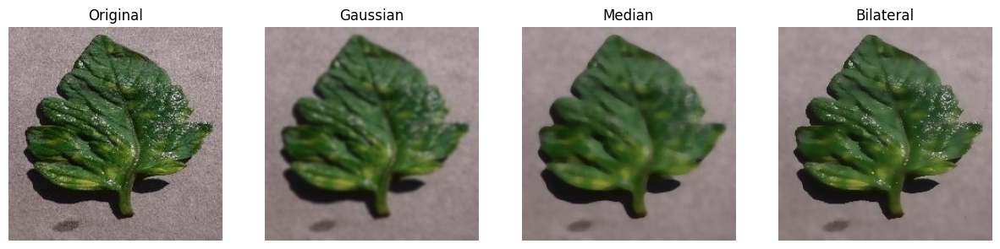

✓ Filtering completed!
  Bilateral filter preserves edges best while smoothing


In [15]:
"""
CELL 7: Filtering Techniques
"""
# Ensure the selected image is loaded
img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

# Different filters
gaussian = cv2.GaussianBlur(img, (7, 7), 0)
median = cv2.medianBlur(img, 7)
bilateral = cv2.bilateralFilter(img, 9, 75, 75)

# Display
filters = [img, gaussian, median, bilateral]
titles = ['Original', 'Gaussian', 'Median', 'Bilateral']
show_images(filters, titles, rows=1)

print("✓ Filtering completed!")
print("  Bilateral filter preserves edges best while smoothing")

# ============================================================================


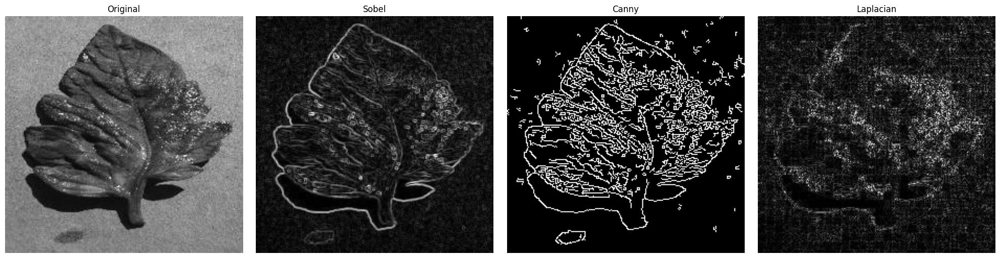

✓ Edge detection completed!
  Canny provides cleanest edge detection


In [16]:
"""
CELL 8: Edge Detection
"""
# Ensure the selected image is loaded
img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Sobel
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
sobel = np.sqrt(sobelx**2 + sobely**2)
sobel = np.uint8(sobel / sobel.max() * 255)

# Canny
canny = cv2.Canny(gray, 100, 200)

# Laplacian
laplacian = cv2.Laplacian(gray, cv2.CV_64F)
laplacian = np.uint8(np.absolute(laplacian))

# Display
edges = [gray, sobel, canny, laplacian]
titles = ['Original', 'Sobel', 'Canny', 'Laplacian']

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for ax, edge, title in zip(axes, edges, titles):
    ax.imshow(edge, cmap='gray')
    ax.set_title(title)
    ax.axis('off')
plt.tight_layout()
plt.show()

print("✓ Edge detection completed!")
print("  Canny provides cleanest edge detection")

# ============================================================================


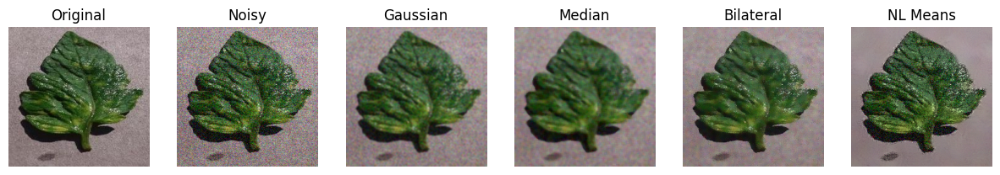


Restoration Quality (PSNR):
  Gaussian    : PSNR=25.28 dB, SSIM=0.6154
  Median      : PSNR=24.07 dB, SSIM=0.4939
  Bilateral   : PSNR=27.00 dB, SSIM=0.6878
  NL Means    : PSNR=24.19 dB, SSIM=0.6088

✓ Noise restoration completed!
  Best performer: Non-Local Means Denoising


In [17]:
"""
CELL 9: Noise Addition and Restoration
"""

# Ensure the selected image is loaded
img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

# Add Gaussian noise
img_float = img.astype(float) / 255.0
noisy = random_noise(img_float, mode='gaussian', var=0.01)
noisy = (noisy * 255).astype(np.uint8)

# Restoration methods
restored_gaussian = cv2.GaussianBlur(noisy, (5, 5), 0)
restored_median = cv2.medianBlur(noisy, 5)
restored_bilateral = cv2.bilateralFilter(noisy, 9, 75, 75)
restored_nlm = cv2.fastNlMeansDenoisingColored(noisy, None, 10, 10, 7, 21)

# Display
results = [img, noisy, restored_gaussian, restored_median, 
          restored_bilateral, restored_nlm]
titles = ['Original', 'Noisy', 'Gaussian', 'Median', 'Bilateral', 'NL Means']
show_images(results, titles, rows=2)

# Calculate metrics
print("\nRestoration Quality (PSNR):")
for name, restored in [('Gaussian', restored_gaussian), 
                       ('Median', restored_median),
                       ('Bilateral', restored_bilateral), 
                       ('NL Means', restored_nlm)]:
    psnr_val = psnr(img, restored)
    ssim_val = ssim(img, restored, channel_axis=2)
    print(f"  {name:12s}: PSNR={psnr_val:.2f} dB, SSIM={ssim_val:.4f}")

print("\n✓ Noise restoration completed!")
print("  Best performer: Non-Local Means Denoising")

# ============================================================================


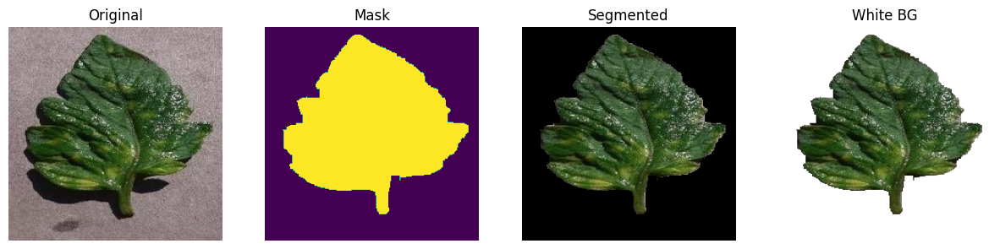

✓ Leaf segmentation completed!
  Tip: Adjust HSV ranges if segmentation is poor


In [18]:
"""
CELL 10: Leaf Segmentation
"""
# Ensure the selected image is loaded
img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

# Convert to HSV for color-based segmentation
hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

# Define green color range (adjust for your dataset)
lower_green = np.array([25, 40, 40])
upper_green = np.array([85, 255, 255])

# Create mask
mask = cv2.inRange(hsv, lower_green, upper_green)

# Morphological operations
kernel = np.ones((5,5), np.uint8)
mask_clean = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)

# Apply mask
segmented = cv2.bitwise_and(img, img, mask=mask_clean)

# White background version
white_bg = img.copy()
white_bg[mask_clean == 0] = [255, 255, 255]

# Display
show_images([img, mask_clean, segmented, white_bg],
           ['Original', 'Mask', 'Segmented', 'White BG'], rows=1)

print("✓ Leaf segmentation completed!")
print("  Tip: Adjust HSV ranges if segmentation is poor")

# ============================================================================


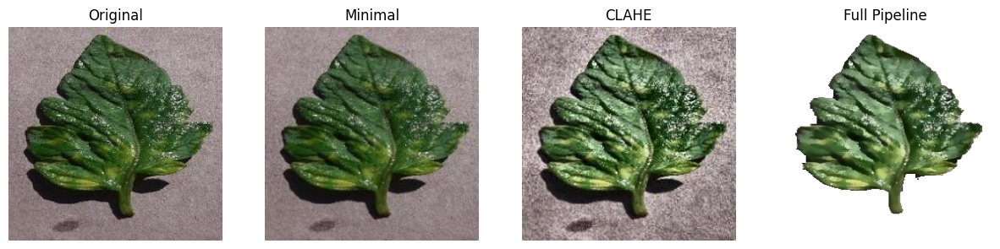

✓ Preprocessing pipeline comparison completed!

Recommendation: Use 'full' pipeline for best results


In [19]:
"""
CELL 11: Complete Preprocessing Pipeline
"""
# Ensure the selected image is loaded
img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)

def preprocess_image(img, pipeline='full'):
    """
    Apply complete preprocessing pipeline
    
    Pipelines:
    - 'minimal': Just resize
    - 'clahe': Resize + CLAHE
    - 'full': Resize + Bilateral + CLAHE + Segmentation
    """
    target_size = (256, 256)
    
    # Resize
    processed = cv2.resize(img, target_size)
    
    if pipeline in ['clahe', 'full']:
        # Apply CLAHE
        img_lab = cv2.cvtColor(processed, cv2.COLOR_RGB2LAB)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        img_lab[:,:,0] = clahe.apply(img_lab[:,:,0])
        processed = cv2.cvtColor(img_lab, cv2.COLOR_LAB2RGB)
    
    if pipeline == 'full':
        # Apply bilateral filter
        processed = cv2.bilateralFilter(processed, 9, 75, 75)
        
        # Segment leaf
        hsv = cv2.cvtColor(processed, cv2.COLOR_RGB2HSV)
        lower = np.array([25, 40, 40])
        upper = np.array([85, 255, 255])
        mask = cv2.inRange(hsv, lower, upper)
        kernel = np.ones((5,5), np.uint8)
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
        processed = cv2.bitwise_and(processed, processed, mask=mask)
        processed[mask == 0] = [255, 255, 255]
    
    return processed

# Test different pipelines
minimal = preprocess_image(img, 'minimal')
clahe_only = preprocess_image(img, 'clahe')
full = preprocess_image(img, 'full')

show_images([img, minimal, clahe_only, full],
           ['Original', 'Minimal', 'CLAHE', 'Full Pipeline'], rows=1)

print("✓ Preprocessing pipeline comparison completed!")
print("\nRecommendation: Use 'full' pipeline for best results")

# ============================================================================


In [27]:
"""
CELL 12: Batch Process Multiple Images (Select Subfolder)
"""

import os
import cv2
import ipywidgets as widgets
from IPython.display import display, clear_output

# Output folder
output_dir = 'preprocessed'
os.makedirs(output_dir, exist_ok=True)

# Get subfolders inside dataset
subfolders = [os.path.join(DATASET_PATH, d) for d in os.listdir(DATASET_PATH) 
              if os.path.isdir(os.path.join(DATASET_PATH, d))]

# Dropdown to select subfolder
folder_dropdown = widgets.Dropdown(
    options=subfolders,
    description='Select folder:',
    layout=widgets.Layout(width='80%')
)
display(folder_dropdown)

# Output widget for messages
out = widgets.Output()
display(out)

# Updated process_and_save function
def process_and_save(image_path, output_dir='preprocessed'):
    try:
        img = cv2.imread(image_path)
        if img is None:
            return None
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        processed = preprocess_image(img, 'full')  # keep RGB
        filename = os.path.basename(image_path)
        output_path = os.path.join(output_dir, filename)
        cv2.imwrite(output_path, cv2.cvtColor(processed, cv2.COLOR_RGB2BGR))
        return output_path
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        return None

# When subfolder is selected, process images
def process_folder(change):
    folder = folder_dropdown.value
    if not folder:
        return
    
    image_paths = [os.path.join(folder, f) for f in os.listdir(folder) 
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    
    with out:
        clear_output(wait=True)
        print(f"Found {len(image_paths)} images in folder: {folder}")
        print("Processing images...")
        processed_count = 0
        for img_path in image_paths:
            if process_and_save(img_path, output_dir):
                processed_count += 1
        print(f"\n✓ Processed {processed_count} images")
        print(f"Saved to: /kaggle/working/{output_dir}/")

# Attach function to dropdown
folder_dropdown.observe(process_folder, names='value')


Dropdown(description='Select folder:', layout=Layout(width='80%'), options=('/kaggle/input/dataset-tomato-spli…

Output()

Images found: ['aug_0_6747.jpg', 'aug_0349.jpg', 'aug_0_8023.jpg', 'aug_0024.jpg', 'Lb557.jpg']


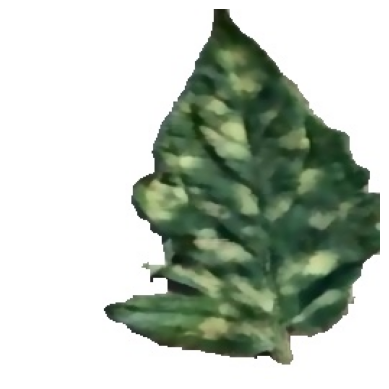

In [29]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Path to the unzipped dataset in /kaggle/working
dataset_dir = '/kaggle/working/preprocessed'  # Change if your folder name is different

# List files
images = [f for f in os.listdir(dataset_dir) if f.endswith('.jpg') or f.endswith('.png')]
print("Images found:", images[:5])  # Show first 5 image names

# Display first image
img_path = os.path.join(dataset_dir, images[1])
img = mpimg.imread(img_path)
plt.imshow(img)
plt.axis('off')
plt.show()


> **Module 2**

In [30]:
"""
CELL 1: Install Additional Libraries
"""
!pip install scikit-image -q

print("✓ Libraries installed!")

# ============================================================================

"""
CELL 2: Import All Libraries
"""
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
import warnings
warnings.filterwarnings('ignore')

from skimage.feature import local_binary_pattern, hog, graycomatrix, graycoprops
from scipy.stats import skew, kurtosis

# ML Libraries
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import (classification_report, confusion_matrix, 
                             accuracy_score, precision_recall_fscore_support)
from sklearn.cluster import KMeans

np.random.seed(42)
plt.style.use('default')

print("✓ All libraries imported!")

# ============================================================================

✓ Libraries installed!
✓ All libraries imported!


In [31]:
# Paths
DATASET_PATH = '/kaggle/input/dataset-tomato-split/train'  # Corrected path
OUTPUT_PATH = '/kaggle/working/module2/'

# Create directories
os.makedirs(f'{OUTPUT_PATH}features/', exist_ok=True)
os.makedirs(f'{OUTPUT_PATH}visualizations/', exist_ok=True)
os.makedirs(f'{OUTPUT_PATH}results/', exist_ok=True)

print(f"✓ Output directory: {OUTPUT_PATH}")


✓ Output directory: /kaggle/working/module2/


In [32]:
# ============================================================================
# COMPLETE FEATURE EXTRACTION SYSTEM WITH INTERACTIVE VISUALIZATION
# Combines: LBP, GLCM, HOG, Color Histograms, Color Moments
# ============================================================================

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output
from skimage.feature import local_binary_pattern, graycomatrix, graycoprops, hog
from scipy.stats import skew, kurtosis
import warnings
warnings.filterwarnings('ignore')

# ============================================================================
# CONFIGURATION
# ============================================================================

DATASET_PATH = '/kaggle/input/dataset-tomato-split/train'

# Verify path exists
if not os.path.exists(DATASET_PATH):
    raise FileNotFoundError(f"Dataset path not found: {DATASET_PATH}")

# ============================================================================
# STATE MANAGEMENT CLASS
# ============================================================================

class ImageFeatureState:
    """Centralized state management for image and extracted features"""
    def __init__(self):
        self.current_image = None
        self.current_path = None
        self.features = {}
        
    def load_image(self, path):
        """Load image once and cache it"""
        if path == self.current_path and self.current_image is not None:
            return self.current_image
            
        img = cv2.imread(path)
        if img is None:
            raise ValueError(f"Failed to load image: {path}")
        
        # Robust format handling
        if len(img.shape) == 2:  # Grayscale
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        elif img.shape[2] == 4:  # RGBA
            img = cv2.cvtColor(img, cv2.COLOR_BGRA2RGB)
        else:  # BGR
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
        self.current_image = img
        self.current_path = path
        self.features = {}  # Reset features when new image loaded
        return img
    
    def get_grayscale(self):
        """Get grayscale version of current image"""
        if self.current_image is None:
            raise ValueError("No image loaded")
        
        if len(self.current_image.shape) == 2:
            return self.current_image
        return cv2.cvtColor(self.current_image, cv2.COLOR_RGB2GRAY)

# Initialize state
state = ImageFeatureState()

# ============================================================================
# FEATURE EXTRACTION FUNCTIONS
# ============================================================================

# -----------------------------------------------------------------------------
# 1. LBP (Local Binary Pattern) - Texture Analysis
# -----------------------------------------------------------------------------

def extract_lbp(image, radius=3, n_points=24, return_image=False):
    """
    Extract LBP texture features
    
    Args:
        image: RGB image (numpy array)
        radius: Radius of circular neighborhood
        n_points: Number of sampling points
        return_image: If True, return LBP image for visualization
        
    Returns:
        hist: Normalized histogram of LBP patterns
        lbp_image: (optional) LBP pattern image
    """
    try:
        # Convert to grayscale safely
        if len(image.shape) == 2:
            gray = image
        else:
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        
        # Compute LBP
        lbp = local_binary_pattern(gray, n_points, radius, method='uniform')
        
        # Calculate histogram
        n_bins = n_points + 2
        hist, _ = np.histogram(lbp.ravel(), bins=n_bins, range=(0, n_bins))
        
        # Normalize
        hist = hist.astype('float')
        hist /= (hist.sum() + 1e-7)
        
        if return_image:
            return hist, lbp.astype(np.uint8)
        return hist
        
    except Exception as e:
        raise RuntimeError(f"LBP extraction failed: {str(e)}")

# -----------------------------------------------------------------------------
# 2. GLCM (Gray Level Co-occurrence Matrix) - Spatial Texture
# -----------------------------------------------------------------------------

def extract_glcm(image, distances=[1, 2, 3], angles=[0, np.pi/4, np.pi/2, 3*np.pi/4], 
                return_image=False):
    """
    Extract GLCM texture features
    
    Args:
        image: RGB image
        distances: List of pixel distances
        angles: List of angles in radians
        return_image: If True, return grayscale image used
        
    Returns:
        features: Array of GLCM properties (contrast, dissimilarity, etc.)
        gray: (optional) Grayscale image used for GLCM
    """
    try:
        # Convert to grayscale
        if len(image.shape) == 2:
            gray = image
        else:
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        
        # Reduce gray levels for computational efficiency
        gray_reduced = (gray / 32).astype(np.uint8)
        
        # Compute GLCM
        glcm = graycomatrix(gray_reduced, distances=distances, angles=angles,
                           levels=8, symmetric=True, normed=True)
        
        # Extract properties
        features = []
        properties = ['contrast', 'dissimilarity', 'homogeneity', 
                     'energy', 'correlation', 'ASM']
        
        for prop in properties:
            prop_values = graycoprops(glcm, prop).flatten()
            features.extend(prop_values)
        
        features = np.array(features)
        
        if return_image:
            return features, gray
        return features
        
    except Exception as e:
        raise RuntimeError(f"GLCM extraction failed: {str(e)}")

# -----------------------------------------------------------------------------
# 3. HOG (Histogram of Oriented Gradients) - Shape/Edge Features
# -----------------------------------------------------------------------------

def extract_hog(image, orientations=9, pixels_per_cell=(8, 8), 
               cells_per_block=(2, 2), return_image=False):
    """
    Extract HOG shape features
    
    Args:
        image: RGB image
        orientations: Number of orientation bins
        pixels_per_cell: Size of a cell
        cells_per_block: Number of cells in each block
        return_image: If True, return HOG visualization
        
    Returns:
        features: HOG feature vector
        hog_image: (optional) HOG visualization
    """
    try:
        # Convert to grayscale
        if len(image.shape) == 2:
            gray = image
        else:
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        
        # Extract HOG features
        if return_image:
            features, hog_image = hog(
                gray,
                orientations=orientations,
                pixels_per_cell=pixels_per_cell,
                cells_per_block=cells_per_block,
                block_norm='L2-Hys',
                visualize=True,
                feature_vector=True
            )
            return features, hog_image
        else:
            features = hog(
                gray,
                orientations=orientations,
                pixels_per_cell=pixels_per_cell,
                cells_per_block=cells_per_block,
                block_norm='L2-Hys',
                visualize=False,
                feature_vector=True
            )
            return features
            
    except Exception as e:
        raise RuntimeError(f"HOG extraction failed: {str(e)}")

# -----------------------------------------------------------------------------
# 4. Color Histogram - Color Distribution
# -----------------------------------------------------------------------------

def extract_color_histogram(image, bins=32, color_space='HSV', return_image=False):
    """
    Extract color histogram features
    
    Args:
        image: RGB image
        bins: Number of histogram bins per channel
        color_space: 'RGB', 'HSV', or 'LAB'
        return_image: If True, return converted image
        
    Returns:
        histogram: Concatenated histograms for all channels
        converted: (optional) Image in target color space
    """
    try:
        # Convert color space
        if color_space == 'HSV':
            converted = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif color_space == 'LAB':
            converted = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        elif color_space == 'RGB':
            converted = image.copy()
        else:
            raise ValueError(f"Unknown color space: {color_space}")
        
        # Calculate histogram for each channel
        histograms = []
        for i in range(3):
            hist, _ = np.histogram(converted[:,:,i], bins=bins, 
                                 range=(0, 256), density=True)
            histograms.extend(hist)
        
        hist_array = np.array(histograms)
        
        if return_image:
            return hist_array, converted
        return hist_array
        
    except Exception as e:
        raise RuntimeError(f"Color histogram extraction failed: {str(e)}")

# -----------------------------------------------------------------------------
# 5. Color Moments - Statistical Color Features
# -----------------------------------------------------------------------------

def extract_color_moments(image, color_space='HSV', return_image=False):
    """
    Extract color statistical moments (mean, std, skewness, kurtosis)
    
    Args:
        image: RGB image
        color_space: 'RGB', 'HSV', or 'LAB'
        return_image: If True, return converted image
        
    Returns:
        moments: Array of statistical moments for each channel
        converted: (optional) Image in target color space
    """
    try:
        # Convert color space
        if color_space == 'HSV':
            converted = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif color_space == 'LAB':
            converted = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        elif color_space == 'RGB':
            converted = image.copy()
        else:
            raise ValueError(f"Unknown color space: {color_space}")
        
        # Calculate moments for each channel
        moments = []
        for i in range(3):
            channel = converted[:,:,i].flatten()
            moments.extend([
                np.mean(channel),           # Mean
                np.std(channel),            # Standard deviation
                skew(channel),              # Skewness
                kurtosis(channel)           # Kurtosis
            ])
        
        moments_array = np.array(moments)
        
        if return_image:
            return moments_array, converted
        return moments_array
        
    except Exception as e:
        raise RuntimeError(f"Color moments extraction failed: {str(e)}")

# -----------------------------------------------------------------------------
# 6. Combined Feature Extraction
# -----------------------------------------------------------------------------

def extract_all_features(image, return_visualizations=False):
    """
    Extract all features from image in one call
    
    Args:
        image: RGB image
        return_visualizations: If True, return images for visualization
        
    Returns:
        features: Combined feature vector
        visualizations: (optional) Dictionary of visualization images
    """
    try:
        visualizations = {}
        
        # Extract all features
        lbp_hist, lbp_img = extract_lbp(image, return_image=True)
        glcm_features, glcm_img = extract_glcm(image, return_image=True)
        hog_features, hog_img = extract_hog(image, return_image=True)
        hist_rgb, rgb_img = extract_color_histogram(image, color_space='RGB', return_image=True)
        hist_hsv, hsv_img = extract_color_histogram(image, color_space='HSV', return_image=True)
        moments_rgb = extract_color_moments(image, color_space='RGB')
        moments_hsv = extract_color_moments(image, color_space='HSV')
        
        # Combine all features
        combined_features = np.concatenate([
            lbp_hist,           # 26 features
            glcm_features,      # 72 features
            hog_features,       # ~8000 features (depends on image size)
            hist_rgb,           # 96 features (32 bins × 3 channels)
            hist_hsv,           # 96 features
            moments_rgb,        # 12 features (4 moments × 3 channels)
            moments_hsv         # 12 features
        ])
        
        if return_visualizations:
            visualizations = {
                'lbp': lbp_img,
                'glcm': glcm_img,
                'hog': hog_img,
                'rgb': rgb_img,
                'hsv': hsv_img
            }
            return combined_features, visualizations
        
        return combined_features
        
    except Exception as e:
        raise RuntimeError(f"Combined feature extraction failed: {str(e)}")

# ============================================================================
# VISUALIZATION FUNCTIONS
# ============================================================================

def visualize_all_features(image):
    """
    Create comprehensive visualization of all extracted features
    
    Args:
        image: RGB image
    """
    try:
        # Extract features with visualizations
        features, vis_images = extract_all_features(image, return_visualizations=True)
        
        # Also get individual feature vectors for detailed display
        lbp_hist, _ = extract_lbp(image, return_image=True)
        glcm_features, _ = extract_glcm(image, return_image=True)
        hog_features, _ = extract_hog(image, return_image=True)
        hist_hsv, _ = extract_color_histogram(image, color_space='HSV', return_image=True)
        moments_hsv = extract_color_moments(image, color_space='HSV')
        
        # Create comprehensive visualization
        fig = plt.figure(figsize=(20, 12))
        
        # Row 1: Original and Feature Images
        plt.subplot(3, 5, 1)
        plt.imshow(image)
        plt.title('Original Image', fontsize=12, fontweight='bold')
        plt.axis('off')
        
        plt.subplot(3, 5, 2)
        plt.imshow(vis_images['lbp'], cmap='gray')
        plt.title('LBP Pattern', fontsize=12, fontweight='bold')
        plt.axis('off')
        
        plt.subplot(3, 5, 3)
        plt.imshow(vis_images['glcm'], cmap='gray')
        plt.title('GLCM (Grayscale)', fontsize=12, fontweight='bold')
        plt.axis('off')
        
        plt.subplot(3, 5, 4)
        plt.imshow(vis_images['hog'], cmap='gray')
        plt.title('HOG Visualization', fontsize=12, fontweight='bold')
        plt.axis('off')
        
        plt.subplot(3, 5, 5)
        plt.imshow(vis_images['hsv'])
        plt.title('HSV Color Space', fontsize=12, fontweight='bold')
        plt.axis('off')
        
        # Row 2: Feature Distributions
        plt.subplot(3, 5, 6)
        plt.bar(range(len(lbp_hist)), lbp_hist, color='steelblue')
        plt.title(f'LBP Histogram ({len(lbp_hist)} bins)', fontsize=11)
        plt.xlabel('Pattern')
        plt.ylabel('Frequency')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(3, 5, 7)
        plt.bar(range(len(glcm_features)), glcm_features, color='forestgreen')
        plt.title(f'GLCM Features ({len(glcm_features)})', fontsize=11)
        plt.xlabel('Feature Index')
        plt.ylabel('Value')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(3, 5, 8)
        plt.plot(hog_features[:200], color='darkred')
        plt.title(f'HOG (first 200 of {len(hog_features)})', fontsize=11)
        plt.xlabel('Feature Index')
        plt.ylabel('Value')
        plt.grid(True, alpha=0.3)
        
        # Row 2, col 4: HSV Histogram
        plt.subplot(3, 5, 9)
        bins_per_channel = len(hist_hsv) // 3
        x = np.arange(bins_per_channel)
        plt.plot(x, hist_hsv[:bins_per_channel], label='Hue', color='red')
        plt.plot(x, hist_hsv[bins_per_channel:2*bins_per_channel], label='Sat', color='green')
        plt.plot(x, hist_hsv[2*bins_per_channel:], label='Val', color='blue')
        plt.title('HSV Histogram', fontsize=11)
        plt.xlabel('Bin')
        plt.ylabel('Frequency')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Row 2, col 5: Color Moments
        plt.subplot(3, 5, 10)
        moment_labels = ['H-μ', 'H-σ', 'H-Skew', 'H-Kurt',
                        'S-μ', 'S-σ', 'S-Skew', 'S-Kurt',
                        'V-μ', 'V-σ', 'V-Skew', 'V-Kurt']
        colors_moments = ['red']*4 + ['green']*4 + ['blue']*4
        plt.bar(range(len(moments_hsv)), moments_hsv, color=colors_moments, alpha=0.7)
        plt.title('HSV Color Moments', fontsize=11)
        plt.xticks(range(len(moments_hsv)), moment_labels, rotation=45, ha='right', fontsize=8)
        plt.ylabel('Value')
        plt.grid(True, alpha=0.3, axis='y')
        
        # Row 3: Feature Summary Statistics
        plt.subplot(3, 5, 11)
        feature_breakdown = {
            'LBP': len(lbp_hist),
            'GLCM': len(glcm_features),
            'HOG': len(hog_features),
            'Hist-RGB': len(hist_hsv),  # Same size as HSV
            'Hist-HSV': len(hist_hsv),
            'Mom-RGB': 12,
            'Mom-HSV': 12
        }
        plt.bar(feature_breakdown.keys(), feature_breakdown.values(), color='orchid')
        plt.title('Feature Vector Sizes', fontsize=11, fontweight='bold')
        plt.ylabel('Number of Features')
        plt.xticks(rotation=45, ha='right')
        plt.grid(True, alpha=0.3, axis='y')
        
        # Row 3: Summary Text
        plt.subplot(3, 5, 12)
        plt.axis('off')
        summary_text = f"""
FEATURE EXTRACTION SUMMARY

Total Features: {len(features)}

Breakdown:
- LBP (texture): {len(lbp_hist)}
- GLCM (texture): {len(glcm_features)}
- HOG (shape): {len(hog_features)}
- RGB Histogram: {len(hist_hsv)}
- HSV Histogram: {len(hist_hsv)}
- RGB Moments: 12
- HSV Moments: 12

Image Shape: {image.shape}
        """
        plt.text(0.1, 0.5, summary_text, fontsize=10, verticalalignment='center',
                family='monospace', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3))
        
        plt.tight_layout()
        plt.show()
        
        # Print detailed information
        print("="*70)
        print("FEATURE EXTRACTION COMPLETE")
        print("="*70)
        print(f"\nTotal feature vector length: {len(features)}")
        print(f"\nFeature breakdown:")
        for name, count in feature_breakdown.items():
            print(f"  {name:12s}: {count:6d} features")
        print(f"\nFeature vector statistics:")
        print(f"  Min:    {features.min():.6f}")
        print(f"  Max:    {features.max():.6f}")
        print(f"  Mean:   {features.mean():.6f}")
        print(f"  Std:    {features.std():.6f}")
        
        return features
        
    except Exception as e:
        print(f"❌ Visualization failed: {str(e)}")
        raise

# ============================================================================
# INTERACTIVE WIDGET SETUP
# ============================================================================

# List subfolders (classes)
subfolders = [f for f in os.listdir(DATASET_PATH) 
              if os.path.isdir(os.path.join(DATASET_PATH, f))]

if not subfolders:
    raise ValueError("No subfolders found in dataset path!")

print(f"Found {len(subfolders)} classes:")
for i, f in enumerate(subfolders, 1):
    print(f"  {i}. {f}")

# Create widgets
folder_dropdown = widgets.Dropdown(
    options=subfolders,
    description='Class:',
    layout=widgets.Layout(width='90%'),
    style={'description_width': '100px'}
)

image_dropdown = widgets.Dropdown(
    options=[],
    description='Image:',
    layout=widgets.Layout(width='90%'),
    style={'description_width': '100px'}
)

# Output widget
out_features = widgets.Output()

# Display widgets
display(widgets.HTML("<h2>🔬 Interactive Feature Extraction System</h2>"))
display(folder_dropdown)
display(image_dropdown)
display(out_features)

# ============================================================================
# WIDGET EVENT HANDLERS
# ============================================================================

def update_images(change):
    """Update image dropdown when folder changes"""
    folder_path = os.path.join(DATASET_PATH, folder_dropdown.value)
    images = [f for f in os.listdir(folder_path) 
              if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    
    if not images:
        with out_features:
            clear_output()
            print(f"⚠️ No images found in folder: {folder_dropdown.value}")
        image_dropdown.options = []
        return
    
    image_dropdown.options = images
    if images:
        image_dropdown.value = images[0]  # Trigger update

def update_features(change):
    """Extract and visualize features for selected image"""
    if not image_dropdown.value:
        return
    
    img_path = os.path.join(DATASET_PATH, folder_dropdown.value, image_dropdown.value)
    
    with out_features:
        clear_output(wait=True)
        
        try:
            print("Loading image and extracting features...")
            print(f"Path: {img_path}\n")
            
            # Load image using state management
            img = state.load_image(img_path)
            
            # Visualize all features
            features = visualize_all_features(img)
            
            # Store in state
            state.features['combined'] = features
            
            print(f"\n✅ Feature extraction successful!")
            print(f"✅ Features stored in state.features['combined']")
            
        except Exception as e:
            print(f"❌ Error: {str(e)}")
            import traceback
            traceback.print_exc()

# Attach observers
folder_dropdown.observe(update_images, names='value')
image_dropdown.observe(update_features, names='value')

# Initialize
update_images(None)

print("\n" + "="*70)
print("✅ INTERACTIVE FEATURE EXTRACTION SYSTEM READY")
print("="*70)
print("Select a class and image from the dropdowns above to extract features.")

Found 9 classes:
  1. Leaf_Mold227
  2. healthy227
  3. Tomato_Yellow_Leaf_Curl_Virus227
  4. Target_Spot227
  5. Septoria_leaf_spot227
  6. Early_blight227
  7. Two-spotted_spider_mite227
  8. Late_blight227
  9. Bacterial_spot227


HTML(value='<h2>🔬 Interactive Feature Extraction System</h2>')

Dropdown(description='Class:', layout=Layout(width='90%'), options=('Leaf_Mold227', 'healthy227', 'Tomato_Yell…

Dropdown(description='Image:', layout=Layout(width='90%'), options=(), style=DescriptionStyle(description_widt…

Output()


✅ INTERACTIVE FEATURE EXTRACTION SYSTEM READY
Select a class and image from the dropdowns above to extract features.


In [33]:
# ============================================================================
# CELL 10: Extract Features from All Images (Simple Batch Processing)
# ============================================================================

import os
import cv2
import numpy as np
from skimage.feature import local_binary_pattern, graycomatrix, graycoprops, hog
from scipy.stats import skew, kurtosis
import warnings
warnings.filterwarnings('ignore')

DATASET_PATH = '/kaggle/input/dataset-tomato-split/train'
OUTPUT_PATH = '/kaggle/working/module2/'

os.makedirs(f'{OUTPUT_PATH}features/', exist_ok=True)

# ----------------------------------------------------------------------------
# Feature Extraction Functions
# ----------------------------------------------------------------------------

def extract_lbp(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image
    lbp = local_binary_pattern(gray, 24, 3, method='uniform')
    hist, _ = np.histogram(lbp.ravel(), bins=26, range=(0, 26))
    return hist.astype('float') / (hist.sum() + 1e-7)

def extract_glcm(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image
    gray = (gray / 32).astype(np.uint8)
    glcm = graycomatrix(gray, [1, 2, 3], [0, np.pi/4, np.pi/2, 3*np.pi/4], 
                        levels=8, symmetric=True, normed=True)
    features = []
    for prop in ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation', 'ASM']:
        features.extend(graycoprops(glcm, prop).flatten())
    return np.array(features)

def extract_hog(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image
    features = hog(gray, orientations=9, pixels_per_cell=(8, 8),
                   cells_per_block=(2, 2), block_norm='L2-Hys')
    return features

def extract_color_histogram(image, color_space='HSV'):
    if color_space == 'HSV':
        converted = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    else:
        converted = image.copy()
    histograms = []
    for i in range(3):
        hist, _ = np.histogram(converted[:,:,i], bins=32, range=(0, 256), density=True)
        histograms.extend(hist)
    return np.array(histograms)

def extract_color_moments(image, color_space='HSV'):
    if color_space == 'HSV':
        converted = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    else:
        converted = image.copy()
    moments = []
    for i in range(3):
        channel = converted[:,:,i].flatten()
        moments.extend([np.mean(channel), np.std(channel), skew(channel), kurtosis(channel)])
    return np.array(moments)

def extract_all_features(image):
    lbp = extract_lbp(image)
    glcm = extract_glcm(image)
    hog_feat = extract_hog(image)
    hist_rgb = extract_color_histogram(image, 'RGB')
    hist_hsv = extract_color_histogram(image, 'HSV')
    moments_rgb = extract_color_moments(image, 'RGB')
    moments_hsv = extract_color_moments(image, 'HSV')
    
    return np.concatenate([lbp, glcm, hog_feat, hist_rgb, hist_hsv, moments_rgb, moments_hsv])

# ----------------------------------------------------------------------------
# Load Images and Extract Features
# ----------------------------------------------------------------------------

print("Loading images from dataset...")

X = []
y = []
image_count = 0

# Loop through each class folder
for class_name in os.listdir(DATASET_PATH):
    class_path = os.path.join(DATASET_PATH, class_name)
    
    if not os.path.isdir(class_path):
        continue
    
    print(f"\nProcessing class: {class_name}")
    
    # Loop through images in class
    for img_file in os.listdir(class_path):
        if not img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        
        img_path = os.path.join(class_path, img_file)
        
        try:
            # Load image
            img = cv2.imread(img_path)
            if img is None:
                continue
            
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (256, 256))  # Resize for consistency
            
            # Extract features
            features = extract_all_features(img)
            
            X.append(features)
            y.append(class_name)
            image_count += 1
            
            if image_count % 50 == 0:
                print(f"  Processed {image_count} images...")
            
        except Exception as e:
            print(f"  ⚠️ Error processing {img_file}: {e}")
            continue

# Convert to numpy arrays
X = np.array(X)
y = np.array(y)

print("\n" + "="*70)
print("FEATURE EXTRACTION COMPLETE")
print("="*70)
print(f"Total images processed: {len(X)}")
print(f"Feature vector size: {X.shape[1]}")
print(f"Classes: {np.unique(y)}")
print(f"Class distribution:")
for class_name in np.unique(y):
    count = np.sum(y == class_name)
    print(f"  {class_name}: {count} images")

# Save features
np.save(f'{OUTPUT_PATH}features/X_features.npy', X)
np.save(f'{OUTPUT_PATH}features/y_labels.npy', y)

print(f"\n✓ Features saved to {OUTPUT_PATH}features/")
print("✅ Ready for Cell 11!")

Loading images from dataset...

Processing class: Leaf_Mold227
  Processed 50 images...
  Processed 100 images...
  Processed 150 images...
  Processed 200 images...
  Processed 250 images...
  Processed 300 images...
  Processed 350 images...
  Processed 400 images...
  Processed 450 images...
  Processed 500 images...
  Processed 550 images...
  Processed 600 images...
  Processed 650 images...
  Processed 700 images...
  Processed 750 images...
  Processed 800 images...
  Processed 850 images...
  Processed 900 images...
  Processed 950 images...
  Processed 1000 images...
  Processed 1050 images...
  Processed 1100 images...
  Processed 1150 images...
  Processed 1200 images...
  Processed 1250 images...
  Processed 1300 images...

Processing class: healthy227
  Processed 1350 images...
  Processed 1400 images...
  Processed 1450 images...
  Processed 1500 images...
  Processed 1550 images...
  Processed 1600 images...
  Processed 1650 images...
  Processed 1700 images...
  Process

In [36]:
import os

# Root path to your split dataset
DATASET_PATH = '/kaggle/input/dataset-tomato-split'

splits = ['train', 'valid', 'test']

# First, get all classes from the train folder (assuming all splits have same classes)
classes = [f for f in os.listdir(os.path.join(DATASET_PATH, 'train')) 
           if os.path.isdir(os.path.join(DATASET_PATH, 'train', f))]

# Dictionary to store counts
counts_summary = {cls: {'train':0, 'valid':0, 'test':0} for cls in classes}

# Count images per split
for split in splits:
    split_path = os.path.join(DATASET_PATH, split)
    for cls in classes:
        cls_path = os.path.join(split_path, cls)
        if os.path.exists(cls_path):
            images = [f for f in os.listdir(cls_path) if f.lower().endswith(('.jpg','.jpeg','.png'))]
            counts_summary[cls][split] = len(images)

# Print summary table
print(f"{'Class':35s} {'Train':>6s} {'Valid':>6s} {'Test':>6s} {'Total':>6s}")
print("-"*65)
for cls in classes:
    t = counts_summary[cls]['train']
    v = counts_summary[cls]['valid']
    te = counts_summary[cls]['test']
    total = t + v + te
    print(f"{cls:35s} {t:6d} {v:6d} {te:6d} {total:6d}")


Class                                Train  Valid   Test  Total
-----------------------------------------------------------------
Leaf_Mold227                          1320     60    120   1500
healthy227                            1320     60    120   1500
Tomato_Yellow_Leaf_Curl_Virus227      1320     60    120   1500
Target_Spot227                        1320     60    120   1500
Septoria_leaf_spot227                 1320     60    120   1500
Early_blight227                       1320     60    120   1500
Two-spotted_spider_mite227            1320     60    120   1500
Late_blight227                        1320     60    120   1500
Bacterial_spot227                     1320     60    120   1500


Original features: 34910
Reduced features: 5107
Explained variance: 0.9500


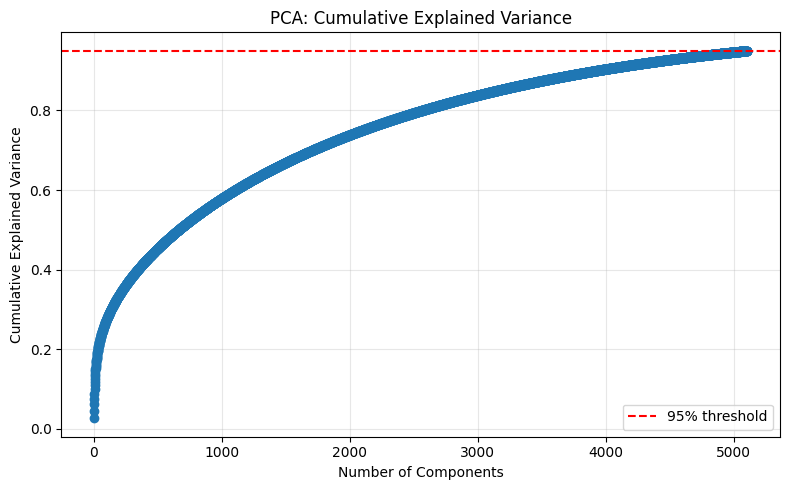

In [38]:
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import os

# Paths
FEATURE_PATH = '/kaggle/working/module2/features'
OUTPUT_PATH = '/kaggle/working/module2/visualizations'

os.makedirs(OUTPUT_PATH, exist_ok=True)

# Load features
X = np.load(os.path.join(FEATURE_PATH, 'X_features.npy'))
y = np.load(os.path.join(FEATURE_PATH, 'y_labels.npy'))

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# Apply PCA
pca = PCA(n_components=0.95, random_state=42)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca  = pca.transform(X_test_scaled)

print(f"Original features: {X_train_scaled.shape[1]}")
print(f"Reduced features: {X_train_pca.shape[1]}")
print(f"Explained variance: {pca.explained_variance_ratio_.sum():.4f}")

# Plot explained variance
cum_var = np.cumsum(pca.explained_variance_ratio_)
plt.figure(figsize=(8,5))
plt.plot(range(1, len(cum_var)+1), cum_var, marker='o')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% threshold')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA: Cumulative Explained Variance')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_PATH, 'pca_cumulative_variance.png'), dpi=300)
plt.show()


In [44]:
# Required imports
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.metrics import accuracy_score, classification_report

# List of classifiers
models = {
    "SVM (RBF)": SVC(kernel='rbf', C=10, gamma='scale', random_state=42),
    "SVM (Poly)": SVC(kernel='poly', degree=3, C=10, gamma='scale', random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, max_depth=20, random_state=42),
    "k-NN": KNeighborsClassifier(n_neighbors=5, weights='distance')
}

# Stratified 5-fold cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Train, predict, and evaluate
for name, model in models.items():
    print(f"\n{name}")
    print("-"*40)
    
    # Cross-validation
    scores = cross_val_score(model, X_train_pca, y_train, cv=skf, scoring='accuracy')
    print(f"CV Accuracy: {scores.mean():.4f} (+/- {scores.std():.4f})")
    
    # Train on full training set
    model.fit(X_train_pca, y_train)
    
    # Test set evaluation
    y_pred = model.predict(X_test_pca)
    acc = accuracy_score(y_test, y_pred)
    print(f"Test Accuracy: {acc:.4f}")
    print("Classification Report:")
    print(classification_report(y_test, y_pred, target_names=le.classes_))



SVM (RBF)
----------------------------------------
CV Accuracy: 0.7720 (+/- 0.0061)
Test Accuracy: 0.7517
Classification Report:
                                  precision    recall  f1-score   support

               Bacterial_spot227       0.66      0.99      0.79       264
                 Early_blight227       0.91      0.59      0.72       264
                  Late_blight227       0.88      0.66      0.75       264
                    Leaf_Mold227       0.89      0.71      0.79       264
           Septoria_leaf_spot227       0.57      0.75      0.65       264
                  Target_Spot227       0.79      0.55      0.64       264
Tomato_Yellow_Leaf_Curl_Virus227       0.97      0.75      0.85       264
      Two-spotted_spider_mite227       0.65      0.82      0.73       264
                      healthy227       0.76      0.94      0.84       264

                        accuracy                           0.75      2376
                       macro avg       0.79      0.75 

**Module 3**

In [ ]:
# ============================
# MODULE 3: Tomato Disease Classification with InceptionV3
# ============================

import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# ----------------------------
# 1️⃣ Dataset Paths
# ----------------------------
TRAIN_DIR = '/kaggle/input/dataset-tomato-split/train'
VALID_DIR = '/kaggle/input/dataset-tomato-split/valid'
TEST_DIR  = '/kaggle/input/dataset-tomato-split/test'

IMG_SIZE = (299, 299)  # InceptionV3 default input size
BATCH_SIZE = 32
NUM_CLASSES = len(os.listdir(TRAIN_DIR))

# ----------------------------
# 2️⃣ Data Augmentation
# ----------------------------
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    shear_range=0.1,
    fill_mode='nearest'
)

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

valid_gen = valid_datagen.flow_from_directory(
    VALID_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_gen = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# ----------------------------
# 3️⃣ Load Pretrained InceptionV3
# ----------------------------
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3))

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Compile model
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# ----------------------------
# 4️⃣ Callbacks (fixed)
# ----------------------------
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True),
    ModelCheckpoint('best_model.keras', monitor='val_accuracy', save_best_only=True)
]

# ----------------------------
# 5️⃣ Train the model
# ----------------------------
history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=20,
    callbacks=callbacks
)

# ----------------------------
# 6️⃣ Save the full model after all epochs (fixed)
# ----------------------------
model.save('full_model_after_epochs.keras')


# ----------------------------
# 7️⃣ Evaluate on test set
# ----------------------------
test_loss, test_acc = model.evaluate(test_gen)
print(f"\n✓ Test Accuracy: {test_acc:.4f}")

# ----------------------------
# 8️⃣ Plot training history
# ----------------------------
plt.figure(figsize=(12,5))

# Accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# ============================
# END OF MODULE 3 PIPELINE
# ============================



2025-12-01 16:04:06.206694: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764605046.389391      47 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764605046.443639      47 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

Found 11880 images belonging to 9 classes.
Found 540 images belonging to 9 classes.
Found 1080 images belonging to 9 classes.


I0000 00:00:1764605068.053426      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1764605068.054091      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20


I0000 00:00:1764605081.668465     132 service.cc:148] XLA service 0x7c101445a980 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1764605081.669329     132 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1764605081.669352     132 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1764605083.634976     132 cuda_dnn.cc:529] Loaded cuDNN version 90300


  1/372 ━━━━━━━━━━━━━━━━━━━━ 2:03:51 20s/step - accuracy: 0.1875 - loss: 2.2564

I0000 00:00:1764605093.421278     132 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


 15/372 ━━━━━━━━━━━━━━━━━━━━ 4:20 729ms/step - accuracy: 0.1243 - loss: 2.4244

Found 11880 images belonging to 9 classes.
Found 540 images belonging to 9 classes.
Found 1080 images belonging to 9 classes.
Epoch 1/10
743/743 ━━━━━━━━━━━━━━━━━━━━ 308s 383ms/step - accuracy: 0.6059 - loss: 1.1946 - val_accuracy: 0.8500 - val_loss: 0.5163 - learning_rate: 1.0000e-05
Epoch 2/10
743/743 ━━━━━━━━━━━━━━━━━━━━ 269s 362ms/step - accuracy: 0.7989 - loss: 0.6069 - val_accuracy: 0.8778 - val_loss: 0.4041 - learning_rate: 1.0000e-05
Epoch 3/10
743/743 ━━━━━━━━━━━━━━━━━━━━ 268s 360ms/step - accuracy: 0.8353 - loss: 0.4840 - val_accuracy: 0.8963 - val_loss: 0.3572 - learning_rate: 1.0000e-05
Epoch 4/10
743/743 ━━━━━━━━━━━━━━━━━━━━ 273s 367ms/step - accuracy: 0.8551 - loss: 0.4295 - val_accuracy: 0.9130 - val_loss: 0.3033 - learning_rate: 1.0000e-05
Epoch 5/10
743/743 ━━━━━━━━━━━━━━━━━━━━ 274s 369ms/step - accuracy: 0.8761 - loss: 0.3526 - val_accuracy: 0.9148 - val_loss: 0.2890 - learning_rate: 1.0000e-05
Epoch 6/10
743/743 ━━━━━━━━━━━━━━━━━━━━ 272s 366ms/step - accuracy: 0.8860

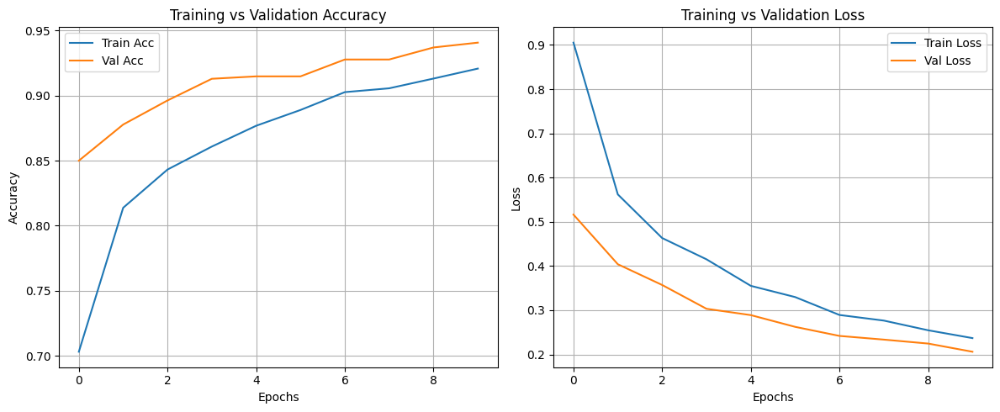

In [3]:
# ============================
# IMPROVE SAVED TOMATO DISEASE MODEL (FIXED)
# ============================

import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

# ----------------------------
# 1️⃣ Dataset Paths
# ----------------------------
TRAIN_DIR = '/kaggle/input/dataset-tomato-split/train'
VALID_DIR = '/kaggle/input/dataset-tomato-split/valid'
TEST_DIR  = '/kaggle/input/dataset-tomato-split/test'

IMG_SIZE = (299, 299)
BATCH_SIZE = 16  # smaller batch for fine-tuning

# ----------------------------
# 2️⃣ Data Augmentation
# ----------------------------
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    vertical_flip=True,
    brightness_range=[0.7,1.3],
    shear_range=0.2,
    fill_mode='nearest'
)

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

valid_gen = valid_datagen.flow_from_directory(
    VALID_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_gen = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# ----------------------------
# 3️⃣ Load Existing Model
# ----------------------------
model = load_model('full_model_after_epochs.keras')  # your 80% accuracy model

# ----------------------------
# 4️⃣ Fine-Tune Last Layers
# ----------------------------
# Unfreeze last 50 layers of the model (skip the final Dense output)
for layer in model.layers[-51:-1]:
    layer.trainable = True

# Re-compile with small learning rate
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# ----------------------------
# 5️⃣ Callbacks
# ----------------------------
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
    ModelCheckpoint('improved_model.keras', monitor='val_accuracy', save_best_only=True)
]

# ----------------------------
# 6️⃣ Fine-Tune Training
# ----------------------------
history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=10,  # fine-tune for 5–10 epochs
    callbacks=callbacks
)

# ----------------------------
# 7️⃣ Evaluate on Test Set
# ----------------------------
test_loss, test_acc = model.evaluate(test_gen)
print(f"\n✓ Test Accuracy After Fine-Tuning: {test_acc:.4f}")

# ----------------------------
# 8️⃣ Plot Training History
# ----------------------------
plt.figure(figsize=(12,5))

# Accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# ============================
# END OF FINE-TUNING PIPELINE
# ============================


2025-12-01 16:57:48.566024: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764608268.835656      47 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764608268.908515      47 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

Found 1080 images belonging to 9 classes.


2025-12-01 16:58:10.059498: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


✓ Model Loaded Successfully!


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1764608299.437906     106 service.cc:148] XLA service 0x7c2420055f70 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1764608299.438785     106 service.cc:156]   StreamExecutor device (0): Host, Default Version
I0000 00:00:1764608302.220595     106 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


68/68 ━━━━━━━━━━━━━━━━━━━━ 160s 2s/step - accuracy: 0.9327 - loss: 0.2036

📌 Test Accuracy = 93.33%
📌 Test Loss      = 0.1791
68/68 ━━━━━━━━━━━━━━━━━━━━ 158s 2s/step


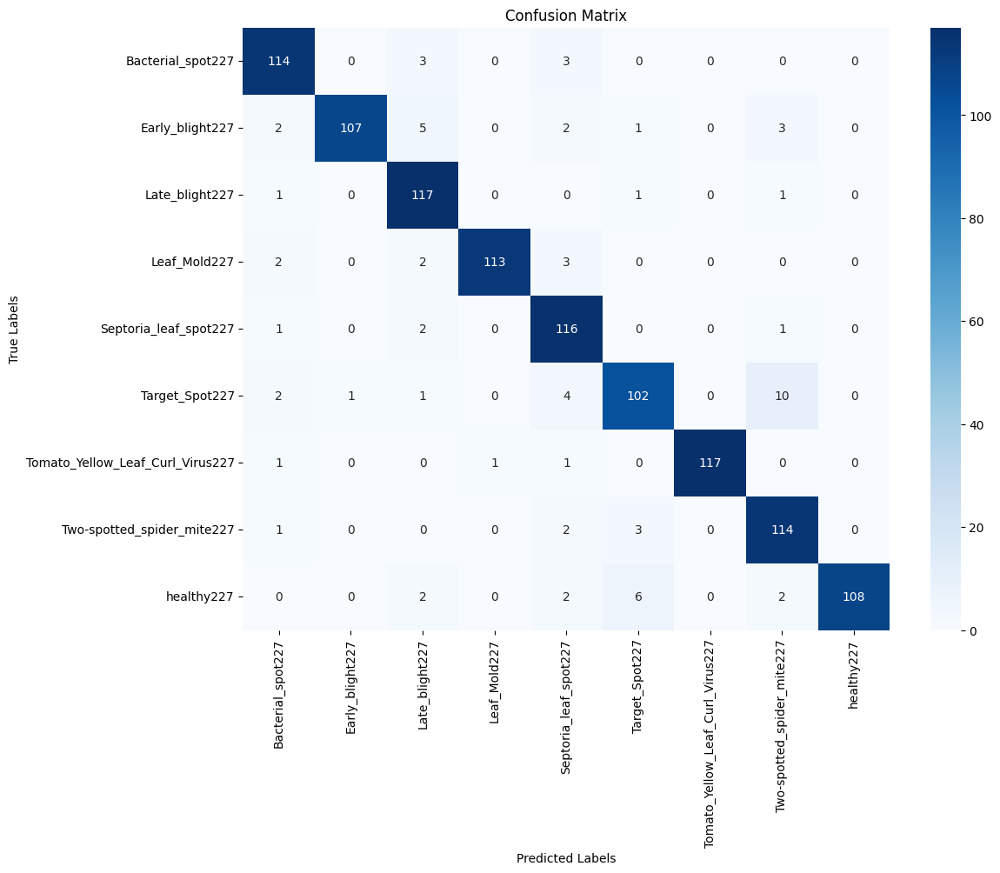


📌 Classification Report:
                                  precision    recall  f1-score   support

               Bacterial_spot227       0.92      0.95      0.93       120
                 Early_blight227       0.99      0.89      0.94       120
                  Late_blight227       0.89      0.97      0.93       120
                    Leaf_Mold227       0.99      0.94      0.97       120
           Septoria_leaf_spot227       0.87      0.97      0.92       120
                  Target_Spot227       0.90      0.85      0.88       120
Tomato_Yellow_Leaf_Curl_Virus227       1.00      0.97      0.99       120
      Two-spotted_spider_mite227       0.87      0.95      0.91       120
                      healthy227       1.00      0.90      0.95       120

                        accuracy                           0.93      1080
                       macro avg       0.94      0.93      0.93      1080
                    weighted avg       0.94      0.93      0.93      1080



In [1]:
# ============================
# EVALUATE SAVED MODEL + CONFUSION MATRIX
# ============================

import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ----------------------------
# 1️⃣ Paths
# ----------------------------
TEST_DIR = "/kaggle/input/dataset-tomato-split/test"
MODEL_PATH = "/kaggle/input/new-model/keras/default/1/improved_model.keras"

IMG_SIZE = (299, 299)
BATCH_SIZE = 16

# ----------------------------
# 2️⃣ Prepare Test Dataset
# ----------------------------
test_datagen = ImageDataGenerator(rescale=1./255)

test_gen = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

class_labels = list(test_gen.class_indices.keys())

# ----------------------------
# 3️⃣ Load Saved Model
# ----------------------------
model = load_model(MODEL_PATH)
print("✓ Model Loaded Successfully!")

# ----------------------------
# 4️⃣ Evaluate Accuracy
# ----------------------------
loss, acc = model.evaluate(test_gen)
print(f"\n📌 Test Accuracy = {acc * 100:.2f}%")
print(f"📌 Test Loss      = {loss:.4f}")

# ----------------------------
# 5️⃣ Predict on Test Set
# ----------------------------
y_pred = model.predict(test_gen)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_gen.classes

# ----------------------------
# 6️⃣ Confusion Matrix
# ----------------------------
cm = confusion_matrix(y_true, y_pred_classes)

plt.figure(figsize=(12, 9))
sns.heatmap(
    cm, annot=True, fmt="d", cmap="Blues",
    xticklabels=class_labels,
    yticklabels=class_labels
)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# ----------------------------
# 7️⃣ Classification Report
# ----------------------------
print("\n📌 Classification Report:")
print(classification_report(y_true, y_pred_classes, target_names=class_labels))


In [26]:
!pip install gradio -q


In [5]:
# ============================
# 🔹 Tomato Disease Classifier - Gradio UI
# ============================

import gradio as gr
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model

# ----------------------------
# 1️⃣ Load trained model
# ----------------------------
MODEL_PATH = "/kaggle/input/new-model/keras/default/1/improved_model.keras"  # adjust path if needed
model = load_model(MODEL_PATH)
print("✅ Model loaded successfully!")

# ----------------------------
# 2️⃣ Prepare class labels
# ----------------------------
# Use the same train_gen.class_indices from training
class_labels = {0: 'Bacterial_spot227', 1: 'Early_blight227', 2: 'Late_blight227',
                3: 'Leaf_Mold227', 4: 'Septoria_leaf_spot227', 5: 'Target_Spot227',
                6: 'Tomato_Yellow_Leaf_Curl_Virus227', 7: 'Two-spotted_spider_mite227',
                8: 'healthy227'}

# ----------------------------
# 3️⃣ Define prediction function
# ----------------------------
def predict_tomato_disease(img):
    # Preprocess image
    img = img.resize((299, 299))
    img_array = img_to_array(img)
    img_array = img_array / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    
    # Predict
    predictions = model.predict(img_array)
    predicted_index = np.argmax(predictions[0])
    confidence = predictions[0][predicted_index] * 100
    
    # Map index to label
    predicted_label = class_labels[predicted_index]
    
    return f"{predicted_label} ({confidence:.2f}%)"

# ----------------------------
# 4️⃣ Create Gradio Interface
# ----------------------------
iface = gr.Interface(
    fn=predict_tomato_disease,
    inputs=gr.Image(type="pil"),
    outputs="text",
    title="Tomato Leaf Disease Classifier",
    description="Upload a tomato leaf image, and the model will predict its disease type with confidence."
)

# ----------------------------
# 5️⃣ Launch UI
# ----------------------------
iface.launch()


2025-12-02 15:43:14.130376: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


✅ Model loaded successfully!
* Running on local URL:  http://127.0.0.1:7860
It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

* Running on public URL: https://e7cfdfca011971c801.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


I0000 00:00:1764690225.202790     109 service.cc:148] XLA service 0x7b93ec055450 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1764690225.203560     109 service.cc:156]   StreamExecutor device (0): Host, Default Version
I0000 00:00:1764690227.456639     109 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_2']]
Received: inputs=Tensor(shape=(1, 299, 299, 3))
  warnings.warn(msg)


✅ Grad-CAM heatmap generated successfully!


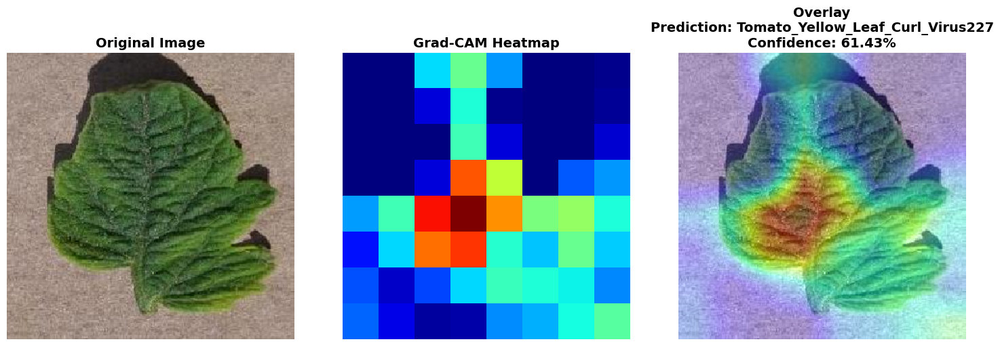

✅ Grad-CAM visualization executed successfully!

Single Image Grad-CAM Analysis:
{'attention_percentage': 12.5, 'center_of_attention': (3.7296850956012597, 4.263963612536032), 'attention_spread': 0.2101074, 'max_activation': 1.0, 'mean_activation': 0.25914454}
✅ Grad-CAM heatmap generated successfully!
✅ Grad-CAM heatmap generated successfully!
✅ Grad-CAM heatmap generated successfully!
✅ Grad-CAM heatmap generated successfully!
✅ Grad-CAM heatmap generated successfully!
✅ Grad-CAM heatmap generated successfully!
✅ Grad-CAM heatmap generated successfully!
✅ Grad-CAM heatmap generated successfully!
✅ Grad-CAM heatmap generated successfully!
GRAD-CAM ANALYSIS ACROSS DISEASE TYPES

Bacterial_spot:
  Attention area: 46.9%
  Max activation: 1.000
  Attention spread: 0.232

Early_blight:
  Attention area: 23.4%
  Max activation: 1.000
  Attention spread: 0.213

Late_blight:
  Attention area: 26.6%
  Max activation: 1.000
  Attention spread: 0.257

Leaf_Mold:
  Attention area: 14.1%
  Max act

In [3]:
# ============================================================================
# COMBINED GRAD-CAM, VISUALIZATION & ANALYSIS
# ============================================================================

import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# ----------------------------
# STEP 1: Grad-CAM Heatmap
# ----------------------------
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    """
    Generate Grad-CAM heatmap
    """
    grad_model = keras.models.Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )
    
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
    
    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)

    print("✅ Grad-CAM heatmap generated successfully!")
    return heatmap.numpy()

# ----------------------------
# STEP 2: Overlay Function
# ----------------------------
def overlay_gradcam(img, heatmap, alpha=0.4):
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    superimposed_img = heatmap * alpha + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)
    return superimposed_img

# ----------------------------
# STEP 3: Visualization
# ----------------------------
def visualize_gradcam(model, img_path, class_names, last_conv_layer_name='mixed10', img_size=(299, 299)):
    # Load and preprocess image
    img = load_img(img_path, target_size=img_size)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = keras.applications.inception_v3.preprocess_input(img_array)
    
    # Prediction
    preds = model.predict(img_array, verbose=0)
    pred_class = np.argmax(preds[0])
    pred_confidence = preds[0][pred_class]
    
    # Grad-CAM heatmap
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    
    # Original image for overlay
    original_img = img_to_array(load_img(img_path, target_size=img_size))
    superimposed_img = overlay_gradcam(original_img, heatmap)
    
    # Display results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(original_img.astype(np.uint8))
    axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(heatmap, cmap='jet')
    axes[1].set_title('Grad-CAM Heatmap', fontsize=14, fontweight='bold')
    axes[1].axis('off')
    
    axes[2].imshow(superimposed_img)
    axes[2].set_title(f'Overlay\nPrediction: {class_names[pred_class]}\nConfidence: {pred_confidence:.2%}',
                     fontsize=14, fontweight='bold')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print("✅ Grad-CAM visualization executed successfully!")
    return heatmap, superimposed_img, pred_class, pred_confidence

# ----------------------------
# STEP 4: Analyze Grad-CAM
# ----------------------------
def analyze_gradcam_focus(heatmap, threshold=0.5):
    """
    Analyze where the model is focusing
    """
    attention_mask = heatmap > threshold
    attention_percentage = np.sum(attention_mask) / attention_mask.size * 100
    y_indices, x_indices = np.indices(heatmap.shape)
    center_y = np.sum(y_indices * heatmap) / np.sum(heatmap)
    center_x = np.sum(x_indices * heatmap) / np.sum(heatmap)
    attention_spread = np.std(heatmap[heatmap > 0.1])
    
    stats = {
        'attention_percentage': attention_percentage,
        'center_of_attention': (center_x, center_y),
        'attention_spread': attention_spread,
        'max_activation': np.max(heatmap),
        'mean_activation': np.mean(heatmap)
    }
    
    return stats

def compare_gradcam_across_classes(model, image_dict, class_names):
    """
    Compare Grad-CAM attention across disease classes
    """
    results = {}
    for disease_name, img_path in image_dict.items():
        img = load_img(img_path, target_size=(299, 299))
        img_array = img_to_array(img)
        img_array_processed = np.expand_dims(img_array, axis=0)
        img_array_processed = keras.applications.inception_v3.preprocess_input(img_array_processed)
        
        heatmap = make_gradcam_heatmap(img_array_processed, model, 'mixed10')
        stats = analyze_gradcam_focus(heatmap)
        results[disease_name] = stats
    
    # Print comparison
    print("="*70)
    print("GRAD-CAM ANALYSIS ACROSS DISEASE TYPES")
    print("="*70)
    for disease, stats in results.items():
        print(f"\n{disease}:")
        print(f"  Attention area: {stats['attention_percentage']:.1f}%")
        print(f"  Max activation: {stats['max_activation']:.3f}")
        print(f"  Attention spread: {stats['attention_spread']:.3f}")
    
    return results

# ----------------------------
# STEP 5: USAGE EXAMPLE
# ----------------------------
# Load model
MODEL_PATH = '/kaggle/input/new-model/keras/default/1/improved_model.keras'
model = keras.models.load_model(MODEL_PATH)

# Class labels
class_labels = {
    0: 'Bacterial_spot227',
    1: 'Early_blight227',
    2: 'Late_blight227',
    3: 'Leaf_Mold227',
    4: 'Septoria_leaf_spot227',
    5: 'Target_Spot227',
    6: 'Tomato_Yellow_Leaf_Curl_Virus227',
    7: 'Two-spotted_spider_mite227',
    8: 'healthy227'
}

# Test image
img_path = '/kaggle/input/dataset-tomato-split/train/Tomato_Yellow_Leaf_Curl_Virus227/Tyl1071.jpg'

# Run visualization
heatmap, overlay_img, pred_class, pred_confidence = visualize_gradcam(model, img_path, class_labels)

# Analyze single image
stats = analyze_gradcam_focus(heatmap)
print("\nSingle Image Grad-CAM Analysis:")
print(stats)

# 1️⃣ Define the dictionary with disease names as keys and image paths as values
image_dict = {
    'Bacterial_spot': '/kaggle/input/dataset-tomato-split/train/Bacterial_spot227/Bs102.jpg',
    'Early_blight': '/kaggle/input/dataset-tomato-split/train/Early_blight227/Eb105.jpg',
    'Late_blight': '/kaggle/input/dataset-tomato-split/train/Late_blight227/Lb1.jpg',
    'Leaf_Mold': '/kaggle/input/dataset-tomato-split/train/Leaf_Mold227/Lm1.jpg',
    'Septoria_leaf_spot': '/kaggle/input/dataset-tomato-split/train/Septoria_leaf_spot227/Slf1.jpg',
    'Target_Spot': '/kaggle/input/dataset-tomato-split/train/Target_Spot227/Ts10.jpg',
    'Tomato_Yellow_Leaf_Curl_Virus': '/kaggle/input/dataset-tomato-split/train/Tomato_Yellow_Leaf_Curl_Virus227/Tyl10.jpg',
    'Two-spotted_spider_mite': '/kaggle/input/dataset-tomato-split/train/Two-spotted_spider_mite227/Tssm1.jpg',
    'healthy': '/kaggle/input/dataset-tomato-split/train/healthy227/H1.jpg'
}

# 2️⃣ Run the comparison function
results = compare_gradcam_across_classes(model, image_dict, class_labels)




In [3]:
# ============================================================================
# CELL 1: IMPORTS AND SETUP
# ============================================================================

import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import pandas as pd
import glob
import os

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

print("✓ TensorFlow version:", tf.__version__)
print("✓ GPU available:", tf.config.list_physical_devices('GPU'))
print("✓ All libraries imported successfully!")

2025-12-01 19:04:59.610654: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764615899.865731      47 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764615899.942299      47 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

✓ TensorFlow version: 2.18.0
✓ GPU available: []
✓ All libraries imported successfully!


2025-12-01 19:05:19.955545: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [4]:
# ============================================================================
# CELL 2: LOAD YOUR TRAINED INCEPTIONV3 MODEL
# ============================================================================

# Load your trained classification model
# Update the path to your saved model
model_path = '/kaggle/input/new-model/keras/default/1/improved_model.keras'
inception_model = keras.models.load_model(model_path)

# Your class names (9 tomato diseases)
class_names = [
    'Bacterial_spot',
    'Early_blight',
    'Late_blight',
    'Leaf_Mold',
    'Septoria_leaf_spot',
    'Spider_mites',
    'Target_Spot',
    'Yellow_Leaf_Curl_Virus',
    'mosaic_virus'
]

print(f"✓ InceptionV3 model loaded successfully!")
print(f"✓ Number of classes: {len(class_names)}")

✓ InceptionV3 model loaded successfully!
✓ Number of classes: 9


In [5]:
# ============================================================================
# CELL 3: BUILD U-NET WITH PRETRAINED RESNET50 ENCODER
# ============================================================================

def build_unet_with_resnet50(input_shape=(256, 256, 3), freeze_encoder=True):
    """
    Build U-Net with pretrained ResNet50 encoder
    
    Encoder: ResNet50 pretrained on ImageNet (feature extraction)
    Decoder: Trained from scratch (learns segmentation)
    
    Parameters:
    - freeze_encoder: True = only train decoder (faster, use for <500 images)
                      False = fine-tune entire model (slower, use for >1000 images)
    """
    
    # Load pretrained ResNet50 without top (classification) layers
    base_model = keras.applications.ResNet50(
        include_top=False,
        weights='imagenet',  # Use ImageNet pretrained weights
        input_shape=input_shape
    )
    
    # Freeze or unfreeze encoder
    base_model.trainable = not freeze_encoder
    
    if freeze_encoder:
        print("✓ Encoder FROZEN - Only decoder will train (faster, recommended)")
    else:
        print("✓ Encoder UNFROZEN - Fine-tuning entire network (slower)")
    
    # Get skip connection layers from ResNet50
    # These preserve spatial information at different resolutions
    layer_names = [
        'conv1_relu',           # 128x128, 64 channels
        'conv2_block3_out',     # 64x64, 256 channels
        'conv3_block4_out',     # 32x32, 512 channels
        'conv4_block6_out',     # 16x16, 1024 channels
    ]
    
    skip_connections = [base_model.get_layer(name).output for name in layer_names]
    
    # Bottleneck (deepest layer)
    bottleneck = base_model.output  # 8x8, 2048 channels
    
    # ========== DECODER (Upsampling with skip connections) ==========
    
    # Block 1: 8x8 → 16x16
    x = layers.UpSampling2D(size=(2, 2), interpolation='bilinear')(bottleneck)
    x = layers.Conv2D(512, 3, activation='relu', padding='same', 
                      kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.concatenate([x, skip_connections[3]])  # Skip connection
    x = layers.Conv2D(512, 3, activation='relu', padding='same',
                      kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    
    # Block 2: 16x16 → 32x32
    x = layers.UpSampling2D(size=(2, 2), interpolation='bilinear')(x)
    x = layers.Conv2D(256, 3, activation='relu', padding='same',
                      kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.concatenate([x, skip_connections[2]])
    x = layers.Conv2D(256, 3, activation='relu', padding='same',
                      kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    
    # Block 3: 32x32 → 64x64
    x = layers.UpSampling2D(size=(2, 2), interpolation='bilinear')(x)
    x = layers.Conv2D(128, 3, activation='relu', padding='same',
                      kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.concatenate([x, skip_connections[1]])
    x = layers.Conv2D(128, 3, activation='relu', padding='same',
                      kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    
    # Block 4: 64x64 → 128x128
    x = layers.UpSampling2D(size=(2, 2), interpolation='bilinear')(x)
    x = layers.Conv2D(64, 3, activation='relu', padding='same',
                      kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.concatenate([x, skip_connections[0]])
    x = layers.Conv2D(64, 3, activation='relu', padding='same',
                      kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    
    # Block 5: 128x128 → 256x256 (back to original size)
    x = layers.UpSampling2D(size=(2, 2), interpolation='bilinear')(x)
    x = layers.Conv2D(32, 3, activation='relu', padding='same',
                      kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(32, 3, activation='relu', padding='same',
                      kernel_initializer='he_normal')(x)
    
    # Output layer: Binary segmentation mask
    outputs = layers.Conv2D(1, 1, activation='sigmoid', name='output')(x)
    
    # Create model
    model = keras.Model(inputs=base_model.input, outputs=outputs, 
                       name='U-Net-ResNet50')
    
    return model

# Build the model
unet_model = build_unet_with_resnet50(
    input_shape=(256, 256, 3),
    freeze_encoder=True  # Freeze encoder for faster training
)

print(f"\n✓ U-Net model built successfully!")
print(f"  Total parameters: {unet_model.count_params():,}")

# Count trainable vs non-trainable parameters
trainable_count = sum([tf.size(w).numpy() for w in unet_model.trainable_weights])
non_trainable_count = sum([tf.size(w).numpy() for w in unet_model.non_trainable_weights])

print(f"  Trainable parameters: {trainable_count:,}")
print(f"  Non-trainable parameters: {non_trainable_count:,}")
print(f"\n  Only {trainable_count/(trainable_count+non_trainable_count)*100:.1f}% of parameters need training!")


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
✓ Encoder FROZEN - Only decoder will train (faster, recommended)

✓ U-Net model built successfully!
  Total parameters: 43,974,113
  Trainable parameters: 20,382,497
  Non-trainable parameters: 23,591,616

  Only 46.4% of parameters need training!


In [6]:
# ============================================================================
# CELL 4: COMPILE MODEL
# ============================================================================

# Compile with appropriate loss and metrics
unet_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    loss='binary_crossentropy',
    metrics=[
        'accuracy',
        keras.metrics.MeanIoU(num_classes=2, name='iou'),
        keras.metrics.Precision(name='precision'),
        keras.metrics.Recall(name='recall')
    ]
)

print("✓ Model compiled successfully!")
print("\nOptimizer: Adam (lr=1e-4)")
print("Loss: Binary Crossentropy")
print("Metrics: Accuracy, IoU, Precision, Recall")

✓ Model compiled successfully!

Optimizer: Adam (lr=1e-4)
Loss: Binary Crossentropy
Metrics: Accuracy, IoU, Precision, Recall


In [8]:
# ============================================================================
# CELL 5: PSEUDO MASK GENERATION FUNCTION
# ============================================================================

def generate_pseudo_mask(image):
    """
    Generate pseudo ground truth mask using color thresholding
    
    No manual labeling needed!
    Uses HSV color space to detect diseased (non-green) regions.
    
    Parameters:
    - image: RGB image (H, W, 3) in range 0-255
    
    Returns:
    - mask: Binary mask (H, W, 1) where 1=diseased, 0=healthy
    """
    
    # Convert to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    
    # Define range for HEALTHY green color
    # H: 25-85 (green hue), S: 40-255 (saturated), V: 40-255 (bright)
    lower_green = np.array([25, 40, 40])
    upper_green = np.array([85, 255, 255])
    
    # Create mask for healthy (green) regions
    healthy_mask = cv2.inRange(hsv, lower_green, upper_green)
    
    # Invert to get diseased regions
    diseased_mask = cv2.bitwise_not(healthy_mask)
    
    # Morphological operations to clean up noise
    kernel = np.ones((5, 5), np.uint8)
    
    # Close small holes
    diseased_mask = cv2.morphologyEx(diseased_mask, cv2.MORPH_CLOSE, kernel)
    
    # Remove small noise
    diseased_mask = cv2.morphologyEx(diseased_mask, cv2.MORPH_OPEN, kernel)
    
    # Normalize to 0-1 range
    diseased_mask = diseased_mask.astype(np.float32) / 255.0
    
    # Add channel dimension: (H, W) → (H, W, 1)
    diseased_mask = np.expand_dims(diseased_mask, axis=-1)
    
    return diseased_mask

print("✓ Pseudo mask generation function defined!")
print("\nThis automatically creates training masks without manual labeling.")
print("Uses HSV color space: Green = healthy, Non-green = diseased")


✓ Pseudo mask generation function defined!

This automatically creates training masks without manual labeling.
Uses HSV color space: Green = healthy, Non-green = diseased


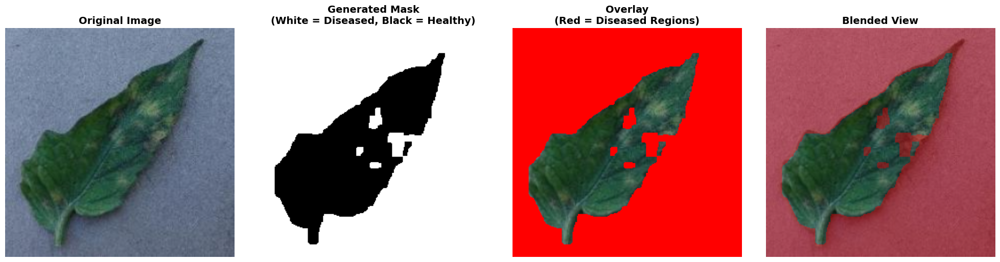

✓ Pseudo mask generation working correctly!
  Mask shape: (256, 256, 1)
  Disease coverage: 73.8% of image


In [9]:
# ============================================================================
# CELL 6: TEST PSEUDO MASK GENERATION
# ============================================================================

# Test on a sample image to verify mask generation works
test_image_path = '/kaggle/input/dataset-tomato-split/test/Leaf_Mold227/Lm136.jpg'

# Load and process image
test_img = cv2.imread(test_image_path)
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
test_img_resized = cv2.resize(test_img, (256, 256))

# Generate mask
test_mask = generate_pseudo_mask(test_img_resized)

# Visualize
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Original image
axes[0].imshow(test_img_resized)
axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Generated mask
axes[1].imshow(test_mask.squeeze(), cmap='gray')
axes[1].set_title('Generated Mask\n(White = Diseased, Black = Healthy)', 
                 fontsize=14, fontweight='bold')
axes[1].axis('off')

# Overlay (red = diseased)
overlay = test_img_resized.copy()
overlay[test_mask.squeeze() > 0.5] = [255, 0, 0]
axes[2].imshow(overlay)
axes[2].set_title('Overlay\n(Red = Diseased Regions)', 
                 fontsize=14, fontweight='bold')
axes[2].axis('off')

# Blended
blended = cv2.addWeighted(test_img_resized, 0.6, overlay, 0.4, 0)
axes[3].imshow(blended)
axes[3].set_title('Blended View', fontsize=14, fontweight='bold')
axes[3].axis('off')

plt.tight_layout()
plt.savefig('/kaggle/working/mask_generation_test.png', dpi=300, bbox_inches='tight')
plt.show()

print("✓ Pseudo mask generation working correctly!")
print(f"  Mask shape: {test_mask.shape}")
print(f"  Disease coverage: {np.mean(test_mask)*100:.1f}% of image")


In [10]:
# ============================================================================
# CELL 7: PREPARE TRAINING DATASET
# ============================================================================

import glob
import cv2
import numpy as np

# ----------------------------
# Paths
# ----------------------------
TRAIN_PATH = '/kaggle/input/dataset-tomato-split/train/*/*.jpg'
VALID_PATH = '/kaggle/input/dataset-tomato-split/valid/*/*.jpg'
TEST_PATH  = '/kaggle/input/dataset-tomato-split/test/*/*.jpg'

# ----------------------------
# Get image paths
# ----------------------------
train_images = glob.glob(TRAIN_PATH)
valid_images = glob.glob(VALID_PATH)
test_images  = glob.glob(TEST_PATH)

print(f"Found {len(train_images)} training images")
print(f"Found {len(valid_images)} validation images")
print(f"Found {len(test_images)} test images")

# ----------------------------
# Use subset for faster training (optional)
# ----------------------------
num_training_images = 500
train_images = train_images[:num_training_images]

# ----------------------------
# Prepare training data
# ----------------------------
print("\nPreparing training data (images + pseudo masks)...")

X_train = []
y_train = []

for idx, img_path in enumerate(train_images):
    if (idx + 1) % 50 == 0:
        print(f"  Processed {idx+1}/{len(train_images)} images...")

    try:
        # Load image
        img = cv2.imread(img_path)
        if img is None:
            continue
        
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        
        # Generate pseudo mask
        mask = generate_pseudo_mask(img)
        
        # Normalize image to [0,1]
        img = img.astype(np.float32) / 255.0
        
        X_train.append(img)
        y_train.append(mask)
        
    except Exception as e:
        print(f"  Error processing {img_path}: {e}")
        continue

# Convert to numpy arrays
X_train = np.array(X_train)
y_train = np.array(y_train)

print(f"\n✓ Training data prepared successfully!")
print(f"  X_train shape: {X_train.shape}")
print(f"  y_train shape: {y_train.shape}")
print(f"  Memory usage: {(X_train.nbytes + y_train.nbytes) / (1024**2):.1f} MB")

# ----------------------------
# Dataset statistics
# ----------------------------
mean_disease_coverage = np.mean(y_train) * 100
num_diseased_images = np.sum(np.mean(y_train, axis=(1,2,3)) > 0.1)

print(f"\nDataset statistics:")
print(f"  Mean disease coverage: {mean_disease_coverage:.1f}%")
print(f"  Images with disease: {num_diseased_images}/{len(y_train)}")


Found 11880 training images
Found 540 validation images
Found 1080 test images

Preparing training data (images + pseudo masks)...
  Processed 50/500 images...
  Processed 100/500 images...
  Processed 150/500 images...
  Processed 200/500 images...
  Processed 250/500 images...
  Processed 300/500 images...
  Processed 350/500 images...
  Processed 400/500 images...
  Processed 450/500 images...
  Processed 500/500 images...

✓ Training data prepared successfully!
  X_train shape: (500, 256, 256, 3)
  y_train shape: (500, 256, 256, 1)
  Memory usage: 500.0 MB

Dataset statistics:
  Mean disease coverage: 69.9%
  Images with disease: 500/500


In [11]:
# ============================================================================
# CELL 8: SETUP CALLBACKS FOR TRAINING
# ============================================================================

# Create directory for saving models
os.makedirs('/kaggle/working/models', exist_ok=True)

# Define callbacks
callbacks = [
    # Save best model
    keras.callbacks.ModelCheckpoint(
        '/kaggle/working/models/unet_resnet50_best.keras',
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False,
        verbose=1
    ),
    
    # Early stopping to prevent overfitting
    keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=3,
        restore_best_weights=True,
        verbose=1
    ),
    
    # Reduce learning rate when validation loss plateaus
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=2,
        min_lr=1e-7,
        verbose=1
    ),
    
    # TensorBoard logging (optional)
    keras.callbacks.TensorBoard(
        log_dir='/kaggle/working/logs',
        histogram_freq=0,
        write_graph=False
    )
]

print("✓ Training callbacks configured:")
print("  • ModelCheckpoint - saves best model")
print("  • EarlyStopping - stops if no improvement for 3 epochs")
print("  • ReduceLROnPlateau - reduces learning rate if stuck")
print("  • TensorBoard - logs training metrics")

✓ Training callbacks configured:
  • ModelCheckpoint - saves best model
  • EarlyStopping - stops if no improvement for 3 epochs
  • ReduceLROnPlateau - reduces learning rate if stuck
  • TensorBoard - logs training metrics


STARTING U-NET TRAINING WITH PRETRAINED RESNET50 ENCODER

Training on 500 images
Batch size: 8
Epochs: 5 (pretrained encoder needs fewer epochs!)
Validation split: 20%

Estimated time: ~10 minutes

Training starting...

Epoch 1/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.6965 - iou: 0.1499 - loss: 0.5874 - precision: 0.8597 - recall: 0.6781
Epoch 1: val_loss improved from inf to 1.30595, saving model to /kaggle/working/models/unet_resnet50_best.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 540s 10s/step - accuracy: 0.6984 - iou: 0.1499 - loss: 0.5847 - precision: 0.8599 - recall: 0.6811 - val_accuracy: 0.4848 - val_iou: 0.1558 - val_loss: 1.3060 - val_precision: 0.9505 - val_recall: 0.2654 - learning_rate: 1.0000e-04
Epoch 2/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.8581 - iou: 0.1499 - loss: 0.3353 - precision: 0.8904 - recall: 0.9092
Epoch 2: val_loss improved from 1.30595 to 0.51790, saving model to /kaggle/working/models/unet_resnet50_best.keras
50/50 ━━━━━━━━━━━━━━━━━━━

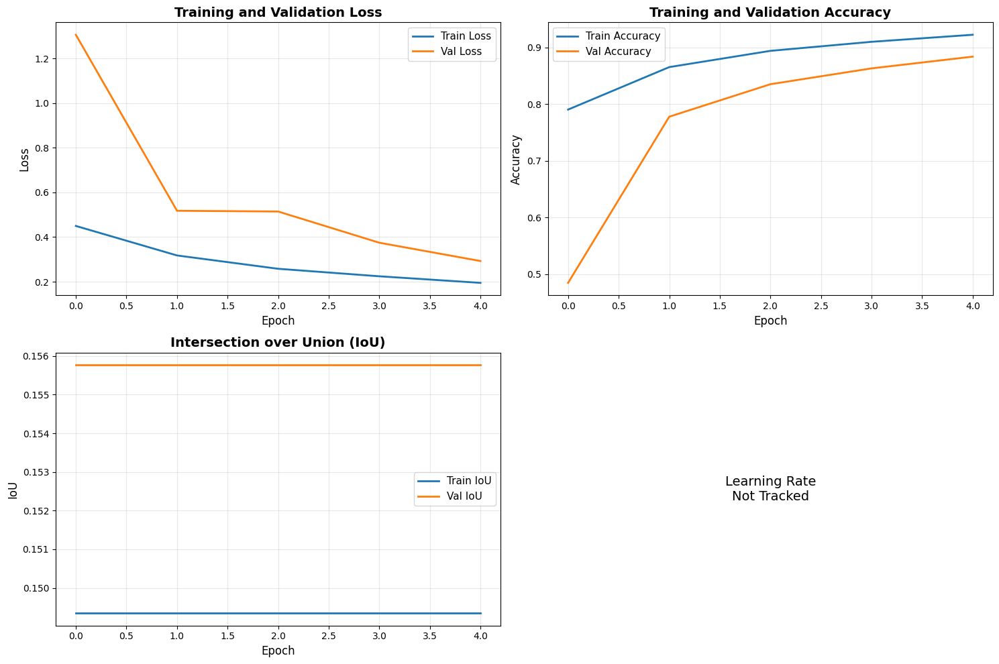

✓ Training history plotted and saved!


In [12]:
# ============================================================================
# CELL 9: TRAIN U-NET (THIS WILL TAKE ~10 MINUTES)
# ============================================================================

print("="*70)
print("STARTING U-NET TRAINING WITH PRETRAINED RESNET50 ENCODER")
print("="*70)
print(f"\nTraining on {len(X_train)} images")
print(f"Batch size: 8")
print(f"Epochs: 5 (pretrained encoder needs fewer epochs!)")
print(f"Validation split: 20%")
print("\nEstimated time: ~10 minutes")
print("\nTraining starting...\n")

# Train the model
history = unet_model.fit(
    X_train, y_train,
    batch_size=8,
    epochs=5,  # Only 5 epochs needed with pretrained encoder!
    validation_split=0.2,
    callbacks=callbacks,
    verbose=1
)

print("\n" + "="*70)
print("✓ TRAINING COMPLETE!")
print("="*70)

# Final metrics
final_train_acc = history.history['accuracy'][-1]
final_val_acc = history.history['val_accuracy'][-1]
final_train_iou = history.history['iou'][-1]
final_val_iou = history.history['val_iou'][-1]

print(f"\nFinal Training Metrics:")
print(f"  Accuracy: {final_train_acc:.4f}")
print(f"  IoU: {final_train_iou:.4f}")

print(f"\nFinal Validation Metrics:")
print(f"  Accuracy: {final_val_acc:.4f}")
print(f"  IoU: {final_val_iou:.4f}")

print(f"\nModel saved to: /kaggle/working/models/unet_resnet50_best.h5")

# ============================================================================
# CELL 10: PLOT TRAINING HISTORY
# ============================================================================

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Loss
axes[0, 0].plot(history.history['loss'], label='Train Loss', linewidth=2)
axes[0, 0].plot(history.history['val_loss'], label='Val Loss', linewidth=2)
axes[0, 0].set_xlabel('Epoch', fontsize=12)
axes[0, 0].set_ylabel('Loss', fontsize=12)
axes[0, 0].set_title('Training and Validation Loss', fontsize=14, fontweight='bold')
axes[0, 0].legend(fontsize=11)
axes[0, 0].grid(True, alpha=0.3)

# Accuracy
axes[0, 1].plot(history.history['accuracy'], label='Train Accuracy', linewidth=2)
axes[0, 1].plot(history.history['val_accuracy'], label='Val Accuracy', linewidth=2)
axes[0, 1].set_xlabel('Epoch', fontsize=12)
axes[0, 1].set_ylabel('Accuracy', fontsize=12)
axes[0, 1].set_title('Training and Validation Accuracy', fontsize=14, fontweight='bold')
axes[0, 1].legend(fontsize=11)
axes[0, 1].grid(True, alpha=0.3)

# IoU
axes[1, 0].plot(history.history['iou'], label='Train IoU', linewidth=2)
axes[1, 0].plot(history.history['val_iou'], label='Val IoU', linewidth=2)
axes[1, 0].set_xlabel('Epoch', fontsize=12)
axes[1, 0].set_ylabel('IoU', fontsize=12)
axes[1, 0].set_title('Intersection over Union (IoU)', fontsize=14, fontweight='bold')
axes[1, 0].legend(fontsize=11)
axes[1, 0].grid(True, alpha=0.3)

# Learning Rate (if available)
if 'lr' in history.history:
    axes[1, 1].plot(history.history['lr'], linewidth=2, color='red')
    axes[1, 1].set_xlabel('Epoch', fontsize=12)
    axes[1, 1].set_ylabel('Learning Rate', fontsize=12)
    axes[1, 1].set_title('Learning Rate Schedule', fontsize=14, fontweight='bold')
    axes[1, 1].set_yscale('log')
    axes[1, 1].grid(True, alpha=0.3)
else:
    axes[1, 1].axis('off')
    axes[1, 1].text(0.5, 0.5, 'Learning Rate\nNot Tracked', 
                   ha='center', va='center', fontsize=14)

plt.tight_layout()
plt.savefig('/kaggle/working/unet_training_history.png', dpi=300, bbox_inches='tight')
plt.show()

print("✓ Training history plotted and saved!")

In [4]:
import warnings
warnings.filterwarnings('ignore')

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.metrics import classification_report , confusion_matrix , accuracy_score , auc
from sklearn.model_selection import train_test_split

import cv2
#from google.colab.patches import cv2_imshow
from PIL import Image 
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Input, Dense,Conv2D , MaxPooling2D, Flatten,BatchNormalization,Dropout
from tensorflow.keras.preprocessing import image_dataset_from_directory
import tensorflow_hub as hub

2025-12-02 12:34:17.703129: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764678857.964506      47 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764678858.042036      47 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

Loading models...


2025-12-02 12:34:38.389443: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


✓ Models loaded successfully!
✓ Classification model: InceptionV3
✓ Segmentation model: U-Net with ResNet50
✓ Number of classes: 9

✓ Analysis function ready!
Analyzing image...
1. Running classification...


I0000 00:00:1764678894.915183      97 service.cc:148] XLA service 0x7d74cc0550a0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1764678894.915857      97 service.cc:156]   StreamExecutor device (0): Host, Default Version
I0000 00:00:1764678897.611872      97 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


   ✓ Disease: Leaf_Mold
   ✓ Confidence: 95.0%
2. Generating Grad-CAM...


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_2']
Received: inputs=Tensor(shape=(1, 299, 299, 3))
  warnings.warn(msg)


   ✓ Grad-CAM generated
3. Running segmentation...
   ✓ Segmentation complete
4. Calculating severity...
   ✓ Severity: 74.2% (Severe)
5. Creating visualization...


/tmp/ipykernel_47/458296818.py:210: UserWarning: Glyph 127807 (\N{HERB}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127807 (\N{HERB}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


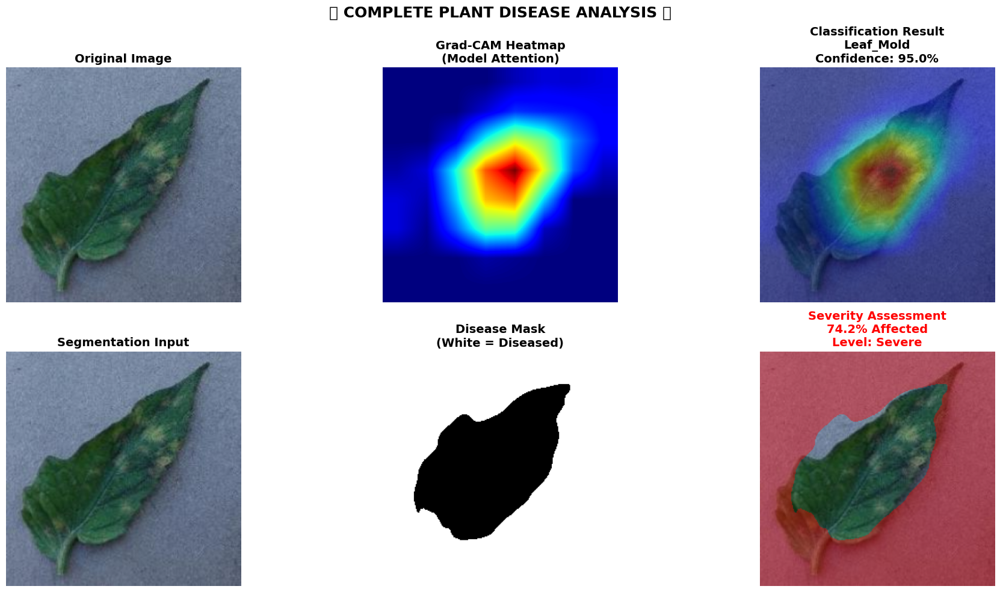


📊 ANALYSIS COMPLETE

🔬 CLASSIFICATION:
   Disease Type: Leaf_Mold
   Confidence: 95.02%

👁️  EXPLAINABILITY (Grad-CAM):
   Model focuses on diseased regions (red areas in heatmap)
   Validates correct feature learning

📍 SEGMENTATION:
   Diseased Area: 74.19% of leaf
   Severity Level: Severe

💊 RECOMMENDATION:
   Immediate treatment required
✓ Batch analysis function ready!

✅ EVERYTHING READY!

To analyze an image:
  analyze_image('/path/to/your/image.jpg')

To analyze multiple images:
  analyze_multiple_images(['image1.jpg', 'image2.jpg'])


In [1]:
# ============================================================================
# COMPLETE WORKING CODE - JUST UPDATE IMAGE PATHS AND RUN!
# ============================================================================

import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow import keras

# ============================================================================
# STEP 1: LOAD MODELS
# ============================================================================

print("Loading models...")

# Load your classification model (InceptionV3)
inception_model = keras.models.load_model('/kaggle/input/new-model/keras/default/1/improved_model.keras')

# Load your segmentation model (U-Net)
unet_model = keras.models.load_model('/kaggle/input/unet-resnet50-best/tensorflow2/default/1/unet_resnet50_best.keras')

# Your class names (9 tomato diseases)
class_names = [
    'Bacterial_spot',
    'Early_blight',
    'Late_blight',
    'Leaf_Mold',
    'Septoria_leaf_spot',
    'Spider_mites',
    'Target_Spot',
    'Yellow_Leaf_Curl_Virus',
    'mosaic_virus'
]

print("✓ Models loaded successfully!")
print(f"✓ Classification model: InceptionV3")
print(f"✓ Segmentation model: U-Net with ResNet50")
print(f"✓ Number of classes: {len(class_names)}")

# ============================================================================
# STEP 2: ANALYSIS FUNCTION
# ============================================================================

def analyze_image(image_path):
    """
    ONE FUNCTION DOES EVERYTHING!
    
    Does: Classification + Grad-CAM + Segmentation + Severity
    
    Usage:
        analyze_image('/path/to/your/image.jpg')
    """
    
    # Load image once
    img_original = cv2.imread(image_path)
    img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)
    
    print("Analyzing image...")
    print("="*70)
    
    # ========== 1. CLASSIFICATION ==========
    print("1. Running classification...")
    
    # Prepare for InceptionV3 (299x299)
    img_cls = cv2.resize(img_original, (299, 299))
    img_cls_input = np.expand_dims(img_cls, axis=0).astype(np.float32)
    img_cls_input = keras.applications.inception_v3.preprocess_input(img_cls_input)
    
    # Predict
    preds = inception_model.predict(img_cls_input, verbose=0)
    pred_class = np.argmax(preds[0])
    confidence = preds[0][pred_class]
    disease_name = class_names[pred_class]
    
    print(f"   ✓ Disease: {disease_name}")
    print(f"   ✓ Confidence: {confidence:.1%}")
    
    # ========== 2. GRAD-CAM ==========
    print("2. Generating Grad-CAM...")
    
    # Create grad model
    grad_model = keras.models.Model(
        inputs=inception_model.inputs,
        outputs=[inception_model.get_layer('mixed10').output, inception_model.output]
    )
    
    # Compute gradient
    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(img_cls_input)
        loss = predictions[:, pred_class]
    
    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    conv_output = conv_output[0]
    heatmap = conv_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    heatmap = heatmap.numpy()
    
    # Resize heatmap to image size
    heatmap_resized = cv2.resize(heatmap, (299, 299))
    heatmap_colored = np.uint8(255 * heatmap_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_colored, cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    
    # Overlay
    gradcam_overlay = heatmap_colored * 0.4 + img_cls * 0.6
    gradcam_overlay = np.clip(gradcam_overlay, 0, 255).astype(np.uint8)
    
    print("   ✓ Grad-CAM generated")
    
    # ========== 3. SEGMENTATION ==========
    print("3. Running segmentation...")
    
    # Prepare for U-Net (256x256)
    img_seg = cv2.resize(img_original, (256, 256))
    img_seg_input = np.expand_dims(img_seg, axis=0).astype(np.float32) / 255.0
    
    # Predict mask
    pred_mask = unet_model.predict(img_seg_input, verbose=0)[0]
    binary_mask = (pred_mask > 0.5).astype(np.uint8).squeeze()
    
    print("   ✓ Segmentation complete")
    
    # ========== 4. SEVERITY ASSESSMENT ==========
    print("4. Calculating severity...")
    
    # Calculate percentage
    severity = (np.sum(binary_mask) / binary_mask.size) * 100
    
    # Classify level
    if severity < 10:
        level = "Minimal"
        level_color = 'green'
        recommendation = "Monitor regularly"
    elif severity < 30:
        level = "Mild"
        level_color = 'yellow'
        recommendation = "Consider preventive measures"
    elif severity < 60:
        level = "Moderate"
        level_color = 'orange'
        recommendation = "Treatment recommended"
    else:
        level = "Severe"
        level_color = 'red'
        recommendation = "Immediate treatment required"
    
    print(f"   ✓ Severity: {severity:.1f}% ({level})")
    
    # ========== 5. CREATE VISUALIZATION ==========
    print("5. Creating visualization...")
    
    # Create segmentation overlay
    seg_overlay = img_seg.copy()
    seg_overlay[binary_mask == 1] = [255, 0, 0]  # Red for diseased
    seg_blended = cv2.addWeighted(img_seg, 0.6, seg_overlay, 0.4, 0)
    
    # Create figure
    fig = plt.figure(figsize=(20, 10))
    
    # ===== ROW 1: Classification & Grad-CAM =====
    
    # Original
    ax1 = plt.subplot(2, 3, 1)
    ax1.imshow(img_cls)
    ax1.set_title('Original Image', fontsize=14, fontweight='bold')
    ax1.axis('off')
    
    # Grad-CAM heatmap
    ax2 = plt.subplot(2, 3, 2)
    ax2.imshow(heatmap_resized, cmap='jet')
    ax2.set_title('Grad-CAM Heatmap\n(Model Attention)', fontsize=14, fontweight='bold')
    ax2.axis('off')
    
    # Grad-CAM overlay
    ax3 = plt.subplot(2, 3, 3)
    ax3.imshow(gradcam_overlay)
    ax3.set_title(f'Classification Result\n{disease_name}\nConfidence: {confidence:.1%}',
                 fontsize=14, fontweight='bold')
    ax3.axis('off')
    
    # ===== ROW 2: Segmentation =====
    
    # Original for segmentation
    ax4 = plt.subplot(2, 3, 4)
    ax4.imshow(img_seg)
    ax4.set_title('Segmentation Input', fontsize=14, fontweight='bold')
    ax4.axis('off')
    
    # Binary mask
    ax5 = plt.subplot(2, 3, 5)
    ax5.imshow(binary_mask, cmap='gray')
    ax5.set_title('Disease Mask\n(White = Diseased)', fontsize=14, fontweight='bold')
    ax5.axis('off')
    
    # Severity result
    ax6 = plt.subplot(2, 3, 6)
    ax6.imshow(seg_blended)
    ax6.set_title(f'Severity Assessment\n{severity:.1f}% Affected\nLevel: {level}',
                 fontsize=14, fontweight='bold', color=level_color)
    ax6.axis('off')
    
    # Main title
    plt.suptitle('🌿 COMPLETE PLANT DISEASE ANALYSIS 🌿', 
                fontsize=18, fontweight='bold', y=0.98)
    
    plt.tight_layout()
    plt.show()
    
    # ========== 6. PRINT SUMMARY ==========
    print("\n" + "="*70)
    print("📊 ANALYSIS COMPLETE")
    print("="*70)
    print(f"\n🔬 CLASSIFICATION:")
    print(f"   Disease Type: {disease_name}")
    print(f"   Confidence: {confidence:.2%}")
    
    print(f"\n👁️  EXPLAINABILITY (Grad-CAM):")
    print(f"   Model focuses on diseased regions (red areas in heatmap)")
    print(f"   Validates correct feature learning")
    
    print(f"\n📍 SEGMENTATION:")
    print(f"   Diseased Area: {severity:.2f}% of leaf")
    print(f"   Severity Level: {level}")
    
    print(f"\n💊 RECOMMENDATION:")
    print(f"   {recommendation}")
    
    print("="*70)
    
    # Return results if needed
    return {
        'disease': disease_name,
        'confidence': confidence,
        'severity': severity,
        'level': level,
        'mask': binary_mask,
        'recommendation': recommendation
    }

print("\n✓ Analysis function ready!")

# ============================================================================
# STEP 3: USE IT - PUT YOUR IMAGE PATH HERE! ⬇️⬇️⬇️
# ============================================================================

# SINGLE IMAGE - CHANGE THIS PATH TO YOUR IMAGE
# analyze_image('/kaggle/input/your-dataset/path/to/your/image.jpg')

# Example: Test on one specific image
analyze_image('/kaggle/input/dataset-tomato-split/test/Leaf_Mold227/Lm136.jpg')


# MULTIPLE IMAGES - UNCOMMENT AND USE
"""
test_images = [
    '/kaggle/input/your-dataset/image1.jpg',
    '/kaggle/input/your-dataset/image2.jpg',
    '/kaggle/input/your-dataset/image3.jpg',
]

for img_path in test_images:
    result = analyze_image(img_path)
    print(f"\n✓ {result['disease']}: {result['severity']:.1f}% ({result['level']})")
    print("-"*70)
"""

# ============================================================================
# BATCH ANALYSIS FUNCTION (OPTIONAL)
# ============================================================================

def analyze_multiple_images(image_paths):
    """
    Analyze multiple images and show summary
    
    Usage:
        results = analyze_multiple_images([
            'image1.jpg',
            'image2.jpg',
            'image3.jpg'
        ])
    """
    results = []
    
    for idx, img_path in enumerate(image_paths):
        print(f"\n{'='*70}")
        print(f"IMAGE {idx+1}/{len(image_paths)}: {img_path.split('/')[-1]}")
        print('='*70)
        
        result = analyze_image(img_path)
        results.append(result)
    
    # Summary
    print("\n" + "="*70)
    print("📊 BATCH ANALYSIS SUMMARY")
    print("="*70)
    
    for idx, (img_path, result) in enumerate(zip(image_paths, results)):
        print(f"\n{idx+1}. {img_path.split('/')[-1]}")
        print(f"   Disease: {result['disease']}")
        print(f"   Confidence: {result['confidence']:.1%}")
        print(f"   Severity: {result['severity']:.1f}% ({result['level']})")
    
    print("="*70)
    
    return results

print("✓ Batch analysis function ready!")

# ============================================================================
# READY TO USE!
# ============================================================================

print("\n" + "="*70)
print("✅ EVERYTHING READY!")
print("="*70)
print("\nTo analyze an image:")
print("  analyze_image('/path/to/your/image.jpg')")
print("\nTo analyze multiple images:")
print("  analyze_multiple_images(['image1.jpg', 'image2.jpg'])")
print("="*70)